## Scraping Twitter Data Using snscrape

<br>Package Github: https://github.com/JustAnotherArchivist/snscrape
<br>This notebook will be using the development version of snscrape

<b>Dependencies: </b> 
- Your <b>Python</b> version must be <b>3.8</b> or higher. The development version of snscrape will not work with Python 3.7 or lower. You can download the latest Python version [here](https://www.python.org/downloads/).
- <b>Development version of snscrape</b>, uncomment the pip install line in the below cell to pip install in the notebook if you don't already have it.
- <b>Pandas</b>, the dataframes allows easy manipulation and indexing of data, this is more of a preference but is what I follow in this notebook.

In [1]:
# Run the pip install command below if you don't already have the library
# !pip install git+https://github.com/JustAnotherArchivist/snscrape.git

# Run the below command if you don't already have Pandas
# !pip install pandas

# Imports
import os
import pandas as pd
import numpy as np
import re
import string
import preprocessor as p
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import nltk
import plotly.express as px
import pickle
import joblib
import warnings
warnings.filterwarnings("ignore")

from pprint import pprint
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import confusion_matrix , classification_report, accuracy_score, roc_auc_score
from sklearn.metrics import roc_curve
from yellowbrick.classifier import ROCAUC
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from wordcloud import WordCloud
from sentence_transformers import SentenceTransformer
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from mlxtend.plotting import plot_confusion_matrix
from mlxtend.classifier import StackingCVClassifier
from sklearn import model_selection

# Query by Text Search
The code below will scrape for 1000 tweets between March 1st, 2020 and June 30th, 2021, by a text search then provide a CSV file with Pandas

In [24]:
# Setting variables to be used in format string command below
tweet_count = 1000
text_query = "work from home"
since_date = "2020-03-01"
until_date = "2021-06-30"
near = "Seattle"
within = "100mi"

# Using OS library to call CLI commands in Python
os.system('snscrape --jsonl --max-results {} --since {} twitter-search "{} until:{} near:{} within:{}"> text-query-tweets.json'.format(tweet_count, since_date, text_query, until_date, near, within))

1

In [25]:
# Reads the json generated from the CLI command above and creates a pandas dataframe
tweets_df1 = pd.read_json('text-query-tweets.json', lines=True)

print(f'Shape of tweets_df1 -> Seattle: {tweets_df1.shape}')

# Displays first 5 entries from dataframe
tweets_df1.head()

Shape of tweets_df1 -> Seattle: (406, 29)


,_type,url,date,content,renderedContent,id,user,replyCount,retweetCount,likeCount,...,retweetedTweet,quotedTweet,inReplyToTweetId,inReplyToUser,mentionedUsers,coordinates,place,hashtags,cashtags,card
0,snscrape.modules.twitter.Tweet,https://twitter.com/Dan8arton/status/140966639...,2021-06-29 00:13:54+00:00,Walking home from work. My eyeballs are actual...,Walking home from work. My eyeballs are actual...,1409666398998056962,"{'_type': 'snscrape.modules.twitter.User', 'us...",0,0,0,...,NaN,None,NaN,None,None,{'_type': 'snscrape.modules.twitter.Coordinate...,"{'_type': 'snscrape.modules.twitter.Place', 'f...",None,NaN,None
1,snscrape.modules.twitter.Tweet,https://twitter.com/chickey253/status/14095032...,2021-06-28 13:25:32+00:00,Question for my work from home peeps… how prod...,Question for my work from home peeps… how prod...,1409503232074813440,"{'_type': 'snscrape.modules.twitter.User', 'us...",0,0,0,...,NaN,None,NaN,None,None,{'_type': 'snscrape.modules.twitter.Coordinate...,"{'_type': 'snscrape.modules.twitter.Place', 'f...",[seattleheatwave],NaN,None
2,snscrape.modules.twitter.Tweet,https://twitter.com/thunderstorm106/status/140...,2021-06-28 07:56:43+00:00,@ShannonODKOMO Yeah when I got home from work ...,@ShannonODKOMO Yeah when I got home from work ...,1409420483653619713,"{'_type': 'snscrape.modules.twitter.User', 'us...",0,0,1,...,NaN,None,1.409419e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...","[{'_type': 'snscrape.modules.twitter.User', 'u...",{'_type': 'snscrape.modules.twitter.Coordinate...,"{'_type': 'snscrape.modules.twitter.Place', 'f...",None,NaN,None
3,snscrape.modules.twitter.Tweet,https://twitter.com/riotheatherrr/status/14092...,2021-06-27 19:37:47+00:00,@AngryBlackLady Our old Keurig broke early in ...,@AngryBlackLady Our old Keurig broke early in ...,1409234522432962561,"{'_type': 'snscrape.modules.twitter.User', 'us...",0,0,1,...,NaN,None,1.409233e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...","[{'_type': 'snscrape.modules.twitter.User', 'u...",{'_type': 'snscrape.modules.twitter.Coordinate...,"{'_type': 'snscrape.modules.twitter.Place', 'f...",None,NaN,None
4,snscrape.modules.twitter.Tweet,https://twitter.com/MAndersson1968/status/1408...,2021-06-27 03:13:39+00:00,@bonnevivante I'll probably water at 1am when ...,@bonnevivante I'll probably water at 1am when ...,1408986858097360896,"{'_type': 'snscrape.modules.twitter.User', 'us...",1,0,1,...,NaN,None,1.408987e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...","[{'_type': 'snscrape.modules.twitter.User', 'u...",{'_type': 'snscrape.modules.twitter.Coordinate...,"{'_type': 'snscrape.modules.twitter.Place', 'f...",None,NaN,None


In [26]:
tweets_df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 406 entries, 0 to 405
Data columns (total 29 columns):
 #   Column            Non-Null Count  Dtype              
---  ------            --------------  -----              
 0   _type             406 non-null    object             
 1   url               406 non-null    object             
 2   date              406 non-null    datetime64[ns, UTC]
 3   content           406 non-null    object             
 4   renderedContent   406 non-null    object             
 5   id                406 non-null    int64              
 6   user              406 non-null    object             
 7   replyCount        406 non-null    int64              
 8   retweetCount      406 non-null    int64              
 9   likeCount         406 non-null    int64              
 10  quoteCount        406 non-null    int64              
 11  conversationId    406 non-null    int64              
 12  lang              406 non-null    object             
 13  sourc

In [27]:
for i in tweets_df1[tweets_df1.place.notnull()]['place']:
    pprint(i)

{'_type': 'snscrape.modules.twitter.Place',
 'country': 'Canada',
 'countryCode': 'CA',
 'fullName': 'Victoria, British Columbia',
 'name': 'Victoria',
 'type': 'city'}
{'_type': 'snscrape.modules.twitter.Place',
 'country': 'United States',
 'countryCode': 'US',
 'fullName': 'Seattle, WA',
 'name': 'Seattle',
 'type': 'city'}
{'_type': 'snscrape.modules.twitter.Place',
 'country': 'United States',
 'countryCode': 'US',
 'fullName': 'West Lake Stevens, WA',
 'name': 'West Lake Stevens',
 'type': 'city'}
{'_type': 'snscrape.modules.twitter.Place',
 'country': 'United States',
 'countryCode': 'US',
 'fullName': 'Redmond, WA',
 'name': 'Redmond',
 'type': 'city'}
{'_type': 'snscrape.modules.twitter.Place',
 'country': 'United States',
 'countryCode': 'US',
 'fullName': 'Seattle, WA',
 'name': 'Seattle',
 'type': 'city'}
{'_type': 'snscrape.modules.twitter.Place',
 'country': 'United States',
 'countryCode': 'US',
 'fullName': 'Bainbridge Island, WA',
 'name': 'Bainbridge Island',
 'type':

 'type': 'city'}
{'_type': 'snscrape.modules.twitter.Place',
 'country': 'United States',
 'countryCode': 'US',
 'fullName': 'Seattle, WA',
 'name': 'Seattle',
 'type': 'city'}
{'_type': 'snscrape.modules.twitter.Place',
 'country': 'United States',
 'countryCode': 'US',
 'fullName': 'Seattle, WA',
 'name': 'Seattle',
 'type': 'city'}
{'_type': 'snscrape.modules.twitter.Place',
 'country': 'United States',
 'countryCode': 'US',
 'fullName': 'Heath Building',
 'name': 'Heath Building',
 'type': 'poi'}
{'_type': 'snscrape.modules.twitter.Place',
 'country': 'United States',
 'countryCode': 'US',
 'fullName': 'Seattle, WA',
 'name': 'Seattle',
 'type': 'city'}
{'_type': 'snscrape.modules.twitter.Place',
 'country': 'United States',
 'countryCode': 'US',
 'fullName': 'Mountlake Terrace, WA',
 'name': 'Mountlake Terrace',
 'type': 'city'}
{'_type': 'snscrape.modules.twitter.Place',
 'country': 'United States',
 'countryCode': 'US',
 'fullName': 'Seattle, WA',
 'name': 'Seattle',
 'type': 'c

In [28]:
for i in tweets_df1.content:
    pprint(i)

('Walking home from work. My eyeballs are actually sweating. 🥵 '
 'https://t.co/RIdPiN42sE')
('Question for my work from home peeps… how productive will you be today? '
 '#seattleheatwave')
('@ShannonODKOMO Yeah when I got home from work my room was 90° degrees it was '
 'a oven but it only took 3hrs to get to where it at right now but I can’t '
 'wait for cooler weather so I can sleep better at night')
('@AngryBlackLady Our old Keurig broke early in the pandemic, so we replaced '
 'it with one that makes espresso drinks. That has been a real morale booster '
 'for the work from home/college/high school members of my family.')
"@bonnevivante I'll probably water at 1am when I get home from work...."
('It’s so hot in Seattle, they’ve decided to not open our studio building '
 'Monday for our safety! They told us to work from home, or wherever we can '
 'find shelter. Since that announcement, it’s now expected to be even hotter '
 'Tuesday. Never had this happen at a job before.')
('Mini 

In [29]:
# Setting variables to be used in format string command below
tweet_count = 1000
text_query = "remote work"
since_date = "2020-03-01"
until_date = "2021-06-30"
near = "Austin"
within = "100mi"

# Using OS library to call CLI commands in Python
os.system('snscrape --jsonl --max-results {} --since {} twitter-search "{} until:{} near:{} within:{}"> text-query-tweets.json'.format(tweet_count, since_date, text_query, until_date, near, within))

# Reads the json generated from the CLI command above and creates a pandas dataframe
tweets_df2 = pd.read_json('text-query-tweets.json', lines=True)

print(f'Shape of tweets_df2 -> Austin: {tweets_df2.shape}')

# Displays first 5 entries from dataframe
tweets_df2.head()

Shape of tweets_df2 -> Austin: (160, 29)


,_type,url,date,content,renderedContent,id,user,replyCount,retweetCount,likeCount,...,retweetedTweet,quotedTweet,inReplyToTweetId,inReplyToUser,mentionedUsers,coordinates,place,hashtags,cashtags,card
0,snscrape.modules.twitter.Tweet,https://twitter.com/itsmedoublez/status/140999...,2021-06-29 22:19:14+00:00,if twitter ever treats a photo of Spencer and ...,if twitter ever treats a photo of Spencer and ...,1409999930882768898,"{'_type': 'snscrape.modules.twitter.User', 'us...",0,0,7,...,NaN,None,NaN,None,None,{'_type': 'snscrape.modules.twitter.Coordinate...,"{'_type': 'snscrape.modules.twitter.Place', 'f...",None,NaN,None
1,snscrape.modules.twitter.Tweet,https://twitter.com/leannecasarez/status/14099...,2021-06-29 21:35:26+00:00,Stay south w/in laws. Took my laptop for remot...,Stay south w/in laws. Took my laptop for remot...,1409988908989943812,"{'_type': 'snscrape.modules.twitter.User', 'us...",0,0,0,...,NaN,None,1.409988e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...",None,{'_type': 'snscrape.modules.twitter.Coordinate...,"{'_type': 'snscrape.modules.twitter.Place', 'f...",None,NaN,None
2,snscrape.modules.twitter.Tweet,https://twitter.com/samisparber/status/1409888...,2021-06-29 14:55:57+00:00,"Apartment sizes are growing across the U.S., a...","Apartment sizes are growing across the U.S., a...",1409888372945006596,"{'_type': 'snscrape.modules.twitter.User', 'us...",0,7,28,...,NaN,None,NaN,None,"[{'_type': 'snscrape.modules.twitter.User', 'u...",{'_type': 'snscrape.modules.twitter.Coordinate...,"{'_type': 'snscrape.modules.twitter.Place', 'f...",None,NaN,"{'_type': 'snscrape.modules.twitter.Card', 'ti..."
3,snscrape.modules.twitter.Tweet,https://twitter.com/ERICdeSegundo/status/14088...,2021-06-26 15:51:49+00:00,"Last night was weird, WET and wild. Probably b...","Last night was weird, WET and wild. Probably b...",1408815269057908738,"{'_type': 'snscrape.modules.twitter.User', 'us...",0,0,5,...,NaN,None,NaN,None,None,{'_type': 'snscrape.modules.twitter.Coordinate...,"{'_type': 'snscrape.modules.twitter.Place', 'f...",None,NaN,None
4,snscrape.modules.twitter.Tweet,https://twitter.com/andytryba/status/140851938...,2021-06-25 20:16:05+00:00,Many companies are rushing to ‘hybrid workplac...,Many companies are rushing to ‘hybrid workplac...,1408519386286149634,"{'_type': 'snscrape.modules.twitter.User', 'us...",0,1,2,...,NaN,None,NaN,None,None,{'_type': 'snscrape.modules.twitter.Coordinate...,"{'_type': 'snscrape.modules.twitter.Place', 'f...",None,NaN,"{'_type': 'snscrape.modules.twitter.Card', 'ti..."


In [30]:
for i in enumerate(tweets_df2.content):
    pprint(i)

(0,
 'if twitter ever treats a photo of Spencer and I the way those crazies did on '
 'that dude’s cute anniversary post I’m pulling up at each person’s house '
 'individually and beating their ass I work remote I’m insane and I have the '
 'time')
(1,
 'Stay south w/in laws. Took my laptop for remote work but Lana stayed wme, '
 'didn’t nap. Been chasing her around all day while trying 2work. Didn’t sleep '
 'well. Still no a/c. I know. I shouldn’t complain. But bitch I’m tired 😭 '
 'mentally exhausted. Takes me back to snowpoco 😣 wine me')
(2,
 'Apartment sizes are growing across the U.S., as developers try to meet '
 'millennials’ needs and accommodate the shift to remote work\n'
 'https://t.co/ZFYKJxjnUC via @WSJ')
(3,
 'Last night was weird, WET and wild. Probably best we work remote and don’t '
 'live in the same city 😅 https://t.co/H7dabBM3zX')
(4,
 'Many companies are rushing to ‘hybrid workplaces’ despite them being the '
 'worst work configuration (power imbalances, poor use 

In [31]:
for i in enumerate(tweets_df2.place):
    pprint(i)

(0,
 {'_type': 'snscrape.modules.twitter.Place',
  'country': 'United States',
  'countryCode': 'US',
  'fullName': 'Austin, TX',
  'name': 'Austin',
  'type': 'city'})
(1,
 {'_type': 'snscrape.modules.twitter.Place',
  'country': 'United States',
  'countryCode': 'US',
  'fullName': 'Austin, TX',
  'name': 'Austin',
  'type': 'city'})
(2,
 {'_type': 'snscrape.modules.twitter.Place',
  'country': 'United States',
  'countryCode': 'US',
  'fullName': 'Austin, TX',
  'name': 'Austin',
  'type': 'city'})
(3,
 {'_type': 'snscrape.modules.twitter.Place',
  'country': 'United States',
  'countryCode': 'US',
  'fullName': 'Austin, TX',
  'name': 'Austin',
  'type': 'city'})
(4,
 {'_type': 'snscrape.modules.twitter.Place',
  'country': 'United States',
  'countryCode': 'US',
  'fullName': 'Austin, TX',
  'name': 'Austin',
  'type': 'city'})
(5,
 {'_type': 'snscrape.modules.twitter.Place',
  'country': 'United States',
  'countryCode': 'US',
  'fullName': 'Austin, TX',
  'name': 'Austin',
  'ty

In [32]:
# Setting variables to be used in format string command below
tweet_count = 1000
text_query = "working remote"
since_date = "2020-03-01"
until_date = "2021-06-30"
near = "Chicago"
within = "100mi"

# Using OS library to call CLI commands in Python
os.system('snscrape --jsonl --max-results {} --since {} twitter-search "{} until:{} near:{} within:{}"> text-query-tweets.json'.format(tweet_count, since_date, text_query, until_date, near, within))

# Reads the json generated from the CLI command above and creates a pandas dataframe
tweets_df3 = pd.read_json('text-query-tweets.json', lines=True)

print(f'Shape of tweets_df3 -> Chicago: {tweets_df3.shape}')

# Displays first 5 entries from dataframe
tweets_df3.head()

Shape of tweets_df3 -> Chicago: (81, 29)


,_type,url,date,content,renderedContent,id,user,replyCount,retweetCount,likeCount,...,retweetedTweet,quotedTweet,inReplyToTweetId,inReplyToUser,mentionedUsers,coordinates,place,hashtags,cashtags,card
0,snscrape.modules.twitter.Tweet,https://twitter.com/soxmachine_josh/status/140...,2021-06-13 19:01:46+00:00,All game long been working with the @fromthe10...,All game long been working with the @fromthe10...,1404152030877396993,"{'_type': 'snscrape.modules.twitter.User', 'us...",1,0,17,...,NaN,None,NaN,None,"[{'_type': 'snscrape.modules.twitter.User', 'u...",{'_type': 'snscrape.modules.twitter.Coordinate...,"{'_type': 'snscrape.modules.twitter.Place', 'f...",None,NaN,None
1,snscrape.modules.twitter.Tweet,https://twitter.com/GregoryBoettner/status/140...,2021-06-09 23:37:50+00:00,@morninggloria We have the exact screen we bou...,@morninggloria We have the exact screen we bou...,1402771951446376452,"{'_type': 'snscrape.modules.twitter.User', 'us...",0,0,1,...,NaN,None,1.402760e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...","[{'_type': 'snscrape.modules.twitter.User', 'u...",{'_type': 'snscrape.modules.twitter.Coordinate...,"{'_type': 'snscrape.modules.twitter.Place', 'f...",None,NaN,None
2,snscrape.modules.twitter.Tweet,https://twitter.com/rodrakic/status/1402285623...,2021-06-08 15:25:20+00:00,Working “remote” this morning. #AFWERX #mobili...,Working “remote” this morning. #AFWERX #mobili...,1402285623734587394,"{'_type': 'snscrape.modules.twitter.User', 'us...",0,0,1,...,NaN,None,NaN,None,None,{'_type': 'snscrape.modules.twitter.Coordinate...,"{'_type': 'snscrape.modules.twitter.Place', 'f...","[AFWERX, mobility, innovation]",NaN,None
3,snscrape.modules.twitter.Tweet,https://twitter.com/ChiScoundrel/status/140012...,2021-06-02 16:22:17+00:00,Someone seems to really enjoy me working remot...,Someone seems to really enjoy me working remot...,1400125627055890436,"{'_type': 'snscrape.modules.twitter.User', 'us...",0,0,9,...,NaN,None,NaN,None,None,{'_type': 'snscrape.modules.twitter.Coordinate...,"{'_type': 'snscrape.modules.twitter.Place', 'f...",None,NaN,None
4,snscrape.modules.twitter.Tweet,https://twitter.com/cktheory/status/1397002243...,2021-05-25 01:31:04+00:00,spent the whole day cleaning and working. I ne...,spent the whole day cleaning and working. I ne...,1397002243241545729,"{'_type': 'snscrape.modules.twitter.User', 'us...",0,0,1,...,NaN,None,NaN,None,None,{'_type': 'snscrape.modules.twitter.Coordinate...,"{'_type': 'snscrape.modules.twitter.Place', 'f...",None,NaN,None


In [34]:
for i in enumerate(tweets_df3.content):
    pprint(i)

(0,
 'All game long been working with the @fromthe108 fellas setting up NEW remote '
 "equipment (It's super sweet) .\n"
 '\n'
 "I watched Rodón's last no-hitter with these guys. Only fitting it may happen "
 'again.')
(1,
 '@morninggloria We have the exact screen we bought for remote schooling and '
 'working with two kids in the house!')
(2,
 'Working “remote” this morning. #AFWERX #mobility #innovation '
 'https://t.co/CttGgtEBVS')
(3, 'Someone seems to really enjoy me working remote https://t.co/Gl3Kcyrrmc')
(4, 'spent the whole day cleaning and working. I need a drink and the remote 😩')
(5,
 'Hi #TwitteRx! My husband is looking for a pharmacist job in the Bethesda,MD '
 'area (~45 minutes or remote)!\n'
 '\n'
 'He has 7 yrs of experience in a community pharmacy as a tech/intern &amp; as '
 'a pharmacist for 1 yr. He’s super hard working, reliable &amp; kind.\n'
 'Accepting any &amp; all suggestions! 😊')
(6,
 'only took me nine months of working remote to learn that i can take very

In [33]:
for i in enumerate(tweets_df3.place):
    pprint(i)

(0,
 {'_type': 'snscrape.modules.twitter.Place',
  'country': 'United States',
  'countryCode': 'US',
  'fullName': 'Chicago, IL',
  'name': 'Chicago',
  'type': 'city'})
(1,
 {'_type': 'snscrape.modules.twitter.Place',
  'country': 'United States',
  'countryCode': 'US',
  'fullName': 'Chicago, IL',
  'name': 'Chicago',
  'type': 'city'})
(2,
 {'_type': 'snscrape.modules.twitter.Place',
  'country': 'United States',
  'countryCode': 'US',
  'fullName': 'Chicago French Press',
  'name': 'Chicago French Press',
  'type': 'poi'})
(3,
 {'_type': 'snscrape.modules.twitter.Place',
  'country': 'United States',
  'countryCode': 'US',
  'fullName': 'Chicago, IL',
  'name': 'Chicago',
  'type': 'city'})
(4,
 {'_type': 'snscrape.modules.twitter.Place',
  'country': 'United States',
  'countryCode': 'US',
  'fullName': 'Chicago, IL',
  'name': 'Chicago',
  'type': 'city'})
(5,
 {'_type': 'snscrape.modules.twitter.Place',
  'country': 'United States',
  'countryCode': 'US',
  'fullName': 'Chicago

In [40]:
tweets_df_USA = pd.concat([pd.concat([tweets_df1, tweets_df2], axis = 0), tweets_df3], axis = 0)

In [48]:
# Setting variables to be used in format string command below
tweet_count = 1000
text_query = "work from home"
since_date = "2020-03-01"
until_date = "2021-06-30"
near = "Bengaluru"
within = "100mi"

# Using OS library to call CLI commands in Python
os.system('snscrape --jsonl --max-results {} --since {} twitter-search "{} until:{} near:{} within:{}"> text-query-tweets.json'.format(tweet_count, since_date, text_query, until_date, near, within))

# Reads the json generated from the CLI command above and creates a pandas dataframe
tweets_df4 = pd.read_json('text-query-tweets.json', lines=True)

print(f'Shape of tweets_df4 -> Bengaluru: {tweets_df4.shape}')

# Displays first 5 entries from dataframe
tweets_df4.head()

Shape of tweets_df4 -> Bengaluru: (105, 29)


,_type,url,date,content,renderedContent,id,user,replyCount,retweetCount,likeCount,...,retweetedTweet,quotedTweet,inReplyToTweetId,inReplyToUser,mentionedUsers,coordinates,place,hashtags,cashtags,card
0,snscrape.modules.twitter.Tweet,https://twitter.com/anoopxh/status/14098218424...,2021-06-29 10:31:35+00:00,Absolutely nothing. It's her space and wish an...,Absolutely nothing. It's her space and wish an...,1409821842462830593,"{'_type': 'snscrape.modules.twitter.User', 'us...",2,0,11,...,NaN,"{'_type': 'snscrape.modules.twitter.Tweet', 'u...",NaN,None,None,{'_type': 'snscrape.modules.twitter.Coordinate...,"{'_type': 'snscrape.modules.twitter.Place', 'f...",None,NaN,None
1,snscrape.modules.twitter.Tweet,https://twitter.com/SupratikChatt17/status/140...,2021-06-28 12:17:45+00:00,work from home mandate. #office #WorkFromHome ...,work from home mandate. #office #WorkFromHome ...,1409486174993797125,"{'_type': 'snscrape.modules.twitter.User', 'us...",0,0,0,...,NaN,None,NaN,None,None,{'_type': 'snscrape.modules.twitter.Coordinate...,"{'_type': 'snscrape.modules.twitter.Place', 'f...","[office, WorkFromHome, hotespresso]",NaN,None
2,snscrape.modules.twitter.Tweet,https://twitter.com/KarthikLSharma/status/1407...,2021-06-24 08:39:09+00:00,@NammaBESCOM Still now power in Ramachandra Ga...,@NammaBESCOM Still now power in Ramachandra Ga...,1407981610775957506,"{'_type': 'snscrape.modules.twitter.User', 'us...",1,0,0,...,NaN,None,1.407953e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...","[{'_type': 'snscrape.modules.twitter.User', 'u...",{'_type': 'snscrape.modules.twitter.Coordinate...,"{'_type': 'snscrape.modules.twitter.Place', 'f...",None,NaN,None
3,snscrape.modules.twitter.Tweet,https://twitter.com/Roja26122993/status/140797...,2021-06-24 08:17:31+00:00,Dear @NammaBESCOM @onlineBESCOM @BSYBJP @Piyus...,Dear @NammaBESCOM @onlineBESCOM @BSYBJP @Piyus...,1407976163868241923,"{'_type': 'snscrape.modules.twitter.User', 'us...",1,0,1,...,NaN,None,NaN,None,"[{'_type': 'snscrape.modules.twitter.User', 'u...",{'_type': 'snscrape.modules.twitter.Coordinate...,"{'_type': 'snscrape.modules.twitter.Place', 'f...",None,NaN,None
4,snscrape.modules.twitter.Tweet,https://twitter.com/SimranThakur1/status/14077...,2021-06-23 17:05:48+00:00,Favourite #workfromhome buddy 🐶🐾💟\n#puppylove ...,Favourite #workfromhome buddy 🐶🐾💟\n#puppylove ...,1407746724404219908,"{'_type': 'snscrape.modules.twitter.User', 'us...",1,0,3,...,NaN,None,NaN,None,None,{'_type': 'snscrape.modules.twitter.Coordinate...,"{'_type': 'snscrape.modules.twitter.Place', 'f...","[workfromhome, puppylove, Puppies, dogsoftwitt...",NaN,None


In [53]:
def scrape_tweets(tweet_count, text_query, since_date, until_date, near, within):
    
    # Using OS library to call CLI commands in Python
    os.system('snscrape --jsonl --max-results {} --since {} twitter-search "{} until:{} near:{} within:{}"> text-query-tweets.json'.format(tweet_count, since_date, text_query, until_date, near, within))

    # Reads the json generated from the CLI command above and creates a pandas dataframe
    tweets = pd.read_json('text-query-tweets.json', lines=True)

    print(f'Shape of tweets -> {near}: {tweets.shape}')

    return tweets

In [55]:
tweets_df5 = scrape_tweets(1000, 'work remote', '2020-03-01', '2021-06-30', 'Mumbai', '100mi')

Shape of tweets -> Mumbai: (65, 29)


In [68]:
tweets_df6 = scrape_tweets(1000, 'worked from home', '2020-03-01', '2021-06-30', 'Hyderabad', '100mi')

Shape of tweets -> Hyderabad: (13, 29)


In [72]:
tweets_df7 = scrape_tweets(1000, 'work from home', '2020-03-01', '2021-06-30', ['Gurgaon', 'Chennai'], '100mi')

Shape of tweets -> ['Gurgaon', 'Chennai']: (285, 29)


In [76]:
tweets_df_India = pd.concat([pd.concat([pd.concat([tweets_df4, tweets_df5], axis = 0), tweets_df6], axis = 0),tweets_df7],axis=0)

In [97]:
tweets_df8 = scrape_tweets(1000, 'remote work', '2020-03-01', '2021-06-30', 'Tokyo', '100mi')

Shape of tweets -> Tokyo: (140, 29)


In [100]:
tweets_df9 = scrape_tweets(1000, 'work from home', '2020-03-01', '2021-06-30', 'Tokyo', '100mi')

Shape of tweets -> Tokyo: (258, 29)


In [103]:
tweets_df_Japan = pd.concat([tweets_df8, tweets_df9],axis=0)

In [108]:
tweets_df10 = scrape_tweets(1000, 'remote work', '2020-03-01', '2021-06-30', 'Berlin', '50mi')

Shape of tweets -> Berlin: (130, 29)


In [114]:
tweets_df11 = scrape_tweets(1000, 'working from home', '2020-03-01', '2021-06-30', 'Munich', '50mi')

Shape of tweets -> Munich: (25, 29)


In [120]:
tweets_df12 = scrape_tweets(1000, 'wfh', '2020-03-01', '2021-06-30', 'Frankfurt', '50mi')

Shape of tweets -> Frankfurt: (12, 29)


In [130]:
tweets_df13 = scrape_tweets(1000, 'work from home', '2020-03-01', '2021-06-30', 'Cologne', '50mi')

Shape of tweets -> Cologne: (35, 29)


In [134]:
tweets_df_Germany = pd.concat([pd.concat([pd.concat([tweets_df10, tweets_df11], axis = 0), tweets_df12], axis = 0),tweets_df13],axis=0)

In [136]:
tweets_df = pd.concat([pd.concat([pd.concat([tweets_df_USA, tweets_df_India], axis = 0), tweets_df_Japan], axis = 0),tweets_df_Germany],axis=0)

In [137]:
tweets_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1715 entries, 0 to 34
Data columns (total 29 columns):
 #   Column            Non-Null Count  Dtype              
---  ------            --------------  -----              
 0   _type             1715 non-null   object             
 1   url               1715 non-null   object             
 2   date              1715 non-null   datetime64[ns, UTC]
 3   content           1715 non-null   object             
 4   renderedContent   1715 non-null   object             
 5   id                1715 non-null   int64              
 6   user              1715 non-null   object             
 7   replyCount        1715 non-null   int64              
 8   retweetCount      1715 non-null   int64              
 9   likeCount         1715 non-null   int64              
 10  quoteCount        1715 non-null   int64              
 11  conversationId    1715 non-null   int64              
 12  lang              1715 non-null   object             
 13  sourc

In [138]:
# Export dataframe into a CSV
tweets_df.to_csv('WFH-tweets.csv', sep=',', index=False)

In [2]:
# Reading the data 
combined_df = pd.read_csv('WFH-tweets.csv')

In [5]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1715 entries, 0 to 1714
Data columns (total 29 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   _type             1715 non-null   object 
 1   url               1715 non-null   object 
 2   date              1715 non-null   object 
 3   content           1715 non-null   object 
 4   renderedContent   1715 non-null   object 
 5   id                1715 non-null   int64  
 6   user              1715 non-null   object 
 7   replyCount        1715 non-null   int64  
 8   retweetCount      1715 non-null   int64  
 9   likeCount         1715 non-null   int64  
 10  quoteCount        1715 non-null   int64  
 11  conversationId    1715 non-null   int64  
 12  lang              1715 non-null   object 
 13  source            1715 non-null   object 
 14  sourceUrl         1715 non-null   object 
 15  sourceLabel       1715 non-null   object 
 16  outlinks          503 non-null    object 


#### first 647 rows USA country code, next 468 rows India, 398 rows Japan, 202 Germany

In [55]:
print(combined_df.index.values)

[   0    1    2 ... 1712 1713 1714]


In [67]:
country = [0]*1715

In [68]:
for i in range(1715):
    if i < 647:
        country[i] = 'USA'
    elif i > 647 and i < 1116:
        country[i] = 'India'
    elif i > 1116 and i < 1515:
        country[i] = 'Japan'
    else:
        country[i] = 'Germany'
    

In [69]:
len(country)

1715

In [70]:
combined_df['country'] = country

In [71]:
combined_df.country.value_counts()

USA        647
India      468
Japan      398
Germany    202
Name: country, dtype: int64

In [119]:
# Export dataframe into a CSV
combined_df.to_csv('WFH-tweets.csv', sep=',', index=False)

In [72]:
content = combined_df.content.tolist()

In [94]:
temp = content[1154].split()

In [98]:
for i in range(len(temp)-1):
    print(temp[i])

在宅勤務の朝
今朝は富士山は見えません
#イマソラ
#在宅勤務
#remotework
#1月28日
#0706am


In [106]:
translator = Translator()

In [110]:
#combined_df['content'][1154:1160].apply(lambda x: translator.translate(x, dest='en').text)

In [139]:
# Removing tweets whose language code is not english
cnt = 0
for i in combined_df.lang:
    if i == 'en':
        cnt += 1
print(cnt)

1410


In [179]:
df_eng = combined_df.loc[combined_df.lang=='en']

In [144]:
df_eng.to_csv('WFH-tweets_eng.csv', sep=',', index=False)

### Sentiment Analysis

In [146]:
# function to print sentiments
# of the sentence.
def sentiment_scores(sentence):
# Create a SentimentIntensityAnalyzer object.
    sid_obj = SentimentIntensityAnalyzer()
# polarity_scores method of SentimentIntensityAnalyzer
# oject gives a sentiment dictionary.
# which contains pos, neg, neu, and compound scores.
    sentiment_dict = sid_obj.polarity_scores(sentence)
    print("Overall sentiment dictionary is : ", sentiment_dict)
    print("sentence was rated as ", sentiment_dict['neg']*100, "% Negative")
    print("sentence was rated as ", sentiment_dict['neu']*100, "% Neutral")
    print("sentence was rated as ", sentiment_dict['pos']*100, "% Positive")
    print("Sentence Overall Rated As", end = " ")
    # decide sentiment as positive, negative and neutral
    if sentiment_dict['compound'] >= 0.05 :
        sentiment = 'positive'
        print("Positive")
    elif sentiment_dict['compound'] <= - 0.05 :
        sentiment = 'negative'
        print("Negative")
    else :
        sentiment = 'neutral'
        print("Neutral")
    return sentiment

In [180]:
sentiment = df_eng['content'].apply(sentiment_scores)

Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.885, 'pos': 0.115, 'compound': 0.6652}
sentence was rated as  0.0 % Negative
sentence was rated as  88.5 % Neutral
sentence was rated as  11.5 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.074, 'neu': 0.926, 'pos': 0.0, 'compound': -0.4215}
sentence was rated as  7.3999999999999995 % Negative
sentence was rated as  92.60000000000001 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Negative
Over

Overall sentiment dictionary is :  {'neg': 0.154, 'neu': 0.846, 'pos': 0.0, 'compound': -0.4767}
sentence was rated as  15.4 % Negative
sentence was rated as  84.6 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.865, 'pos': 0.135, 'compound': 0.2023}
sentence was rated as  0.0 % Negative
sentence was rated as  86.5 % Neutral
sentence was rated as  13.5 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.091, 'neu': 0.806, 'pos': 0.103, 'compound': -0.1027}
sentence was rated as  9.1 % Negative
sentence was rated as  80.60000000000001 % Neutral
sentence was rated as  10.299999999999999 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As N

Overall sentiment dictionary is :  {'neg': 0.057, 'neu': 0.792, 'pos': 0.15, 'compound': 0.5719}
sentence was rated as  5.7 % Negative
sentence was rated as  79.2 % Neutral
sentence was rated as  15.0 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.083, 'neu': 0.833, 'pos': 0.083, 'compound': 0.0}
sentence was rated as  8.3 % Negative
sentence was rated as  83.3 % Neutral
sentence was rated as  8.3 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.212, 'neu': 0.788, 'pos': 0.0, 'compound': -0.9062}
sentence was rated as  21.2 % Negative
sentence was rated as  78.8 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment diction

sentence was rated as  51.5 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.799, 'pos': 0.201, 'compound': 0.7777}
sentence was rated as  0.0 % Negative
sentence was rated as  79.9 % Neutral
sentence was rated as  20.1 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.34}
sentence was rated as  0.0 % Negative
sentence was rated as  83.3 % Neutral
sentence was rated as  16.7 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.111, 'neu': 0.806, 'pos': 0.082, 'compound': 0.1263}
sentence was rated as  11.1 % Negative
sentence was rated as  80.60000000000001 % Neutral
sentence was rated as  8.200000000000001 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.49, 'pos': 0.51, 'compound': 0.9272}
sentence was rated as  0.0 % Negative
sentence was rated as  49.0 %

Overall sentiment dictionary is :  {'neg': 0.085, 'neu': 0.875, 'pos': 0.04, 'compound': -0.4101}
sentence was rated as  8.5 % Negative
sentence was rated as  87.5 % Neutral
sentence was rated as  4.0 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.075, 'neu': 0.746, 'pos': 0.179, 'compound': 0.6889}
sentence was rated as  7.5 % Negative
sentence was rated as  74.6 % Neutral
sentence was rated as  17.9 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.102, 'neu': 0.68, 'pos': 0.218, 'compound': 0.7351}
sentence was rated as  10.2 % Negative
sentence was rated as  68.0 % Neutral
sentence was rated as  21.8 % Positive
Sentence Overall Rated As Positive
Overall sentiment d

Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.5574}
sentence was rated as  9.1 % Negative
sentence was rated as  90.9 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.925, 'pos': 0.075, 'compound': 0.3612}
sentence was rated as  0.0 % Negative
sentence was rated as  92.5 % Neutral
sentence was rated as  7.5 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.865, 'pos': 0.135, 'compound': 0.2584}
sentence was rated as  0.0 % Negative
sentence was rated as  86.5 % Neutral
sentence was rated as  13.5 % Positive
Sentence Overall Rated As Positive
Overall sentiment diction

Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.115, 'neu': 0.885, 'pos': 0.0, 'compound': -0.4404}
sentence was rated as  11.5 % Negative
sentence was rated as  88.5 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.06, 'neu': 0.838, 'pos': 0.102, 'compound': 0.3802}
sentence was rated as  6.0 % Negative
sentence was rated as  83.8 % Neutral
sentence was rated as  10.2 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary i

Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.677, 'pos': 0.323, 'compound': 0.9411}
sentence was rated as  0.0 % Negative
sentence was rated as  67.7 % Neutral
sentence was rated as  32.300000000000004 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.081, 'neu': 0.919, 'pos': 0.0, 'compound': -0.3818}
sentence was rated as  8.1 % Negative
sentence was rated as  91.9 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.034, 'neu': 0.867, 'pos': 0.099, 'compound': 0.4019}
sentence was rated as  3.4000000000000004 % Negative
sentence was rated as  86.7 % Neutral
sentence was rated as  9.9 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.172, 'neu': 0.828, 'pos': 0.0, 'compound': -0.3595}
sentence was rated as  17.2 % Negative
sentence was rated as  82.8 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rat

Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.732, 'pos': 0.268, 'compound': 0.6808}
sentence was rated as  0.0 % Negative
sentence was rated as  73.2 % Neutral
sentence was rated as  26.8 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.127, 'neu': 0.746, 'pos': 0.127, 'compound': 0.0}
sentence was rated as  12.7 % Negative
sentence was rated as  74.6 % Neutral
sentence was rated as  12.7 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :

Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.913, 'pos': 0.087, 'compound': 0.3182}
sentence was rated as  0.0 % Negative
sentence was rated as  91.3 % Neutral
sentence was rated as  8.7 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.068, 'neu': 0.847, 'pos': 0.085, 'compound': -0.0516}
sentence was rated as  6.800000000000001 % Negative
sentence was rated as  84.7 % Neutral
sentence was rated as  8.5 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.078, 'neu': 0.922, 'pos': 0.0, 'compound': -0.296}
sentence was rated as  7.8 % Negative
sentence was rated as  92.2 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall se

Overall sentiment dictionary is :  {'neg': 0.08, 'neu': 0.764, 'pos': 0.156, 'compound': 0.5719}
sentence was rated as  8.0 % Negative
sentence was rated as  76.4 % Neutral
sentence was rated as  15.6 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.793, 'pos': 0.207, 'compound': 0.8932}
sentence was rated as  0.0 % Negative
sentence was rated as  79.3 % Neutral
sentence was rated as  20.7 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.645, 'pos': 0.355, 'compound': 0.9202}
sentence was rated as  0.0 % Negative
sentence was rated as  64.5 % Neutral
sentence was rated as  35.5 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.068, 'neu': 0.932, 'pos': 0.0, 'compound': -0.2732}
sentence was rated as  6.800000000000001 % Negative
sentence was rated as  93.2 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Negative
O

sentence was rated as  94.69999999999999 % Neutral
sentence was rated as  5.3 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.889, 'pos': 0.111, 'compound': 0.7081}
sentence was rated as  0.0 % Negative
sentence was rated as  88.9 % Neutral
sentence was rated as  11.1 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.021, 'neu': 0.759, 'pos': 0.22, 'compound': 0.9058}
sentence was rated as  2.1 % Negative
sentence was rated as  75.9 % Neutral
sentence was rated as  22.0 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.776, 'pos': 0.224, 'compound': 0.6705}
sentence was rated as  0.0 % Negative
sentence was rated as  77.60000000000001 % Neutral
sentence was rated as  22.400000000000002 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.134, 'neu': 0.866, 'pos': 0.0, 'compound': -0.1779}
sentence was 

Overall sentiment dictionary is :  {'neg': 0.351, 'neu': 0.608, 'pos': 0.041, 'compound': -0.9678}
sentence was rated as  35.099999999999994 % Negative
sentence was rated as  60.8 % Neutral
sentence was rated as  4.1000000000000005 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.938, 'pos': 0.062, 'compound': 0.3612}
sentence was rated as  0.0 % Negative
sentence was rated as  93.8 % Neutral
sentence was rated as  6.2 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.129, 'neu': 0.691, 'pos': 0.18, 'compound': 0.296}
sentence was rated as  12.9 % Negative
sentence was rated as  69.1 % Neutral
sentence was rated as  18.0 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As 

Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.887, 'pos': 0.113, 'compound': 0.3182}
sentence was rated as  0.0 % Negative
sentence was rated as  88.7 % Neutral
sentence was rated as  11.3 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.951, 'pos': 0.049, 'compound': 0.4329}
sentence was rated as  0.0 % Negative
sentence was rated as  95.1 % Neutral
sentence was rated as  4.9 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.716, 'pos': 0.284, 'compound': 0.5538}
sentence was rated as  0.0 % Negative
sentence was rated as  71.6 % Neutral
sentence was rated as  28.4 % Positive
Sentence Overall Rated As Positive
Overall sentiment diction

Overall sentiment dictionary is :  {'neg': 0.162, 'neu': 0.691, 'pos': 0.147, 'compound': -0.1586}
sentence was rated as  16.2 % Negative
sentence was rated as  69.1 % Neutral
sentence was rated as  14.7 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.06, 'neu': 0.94, 'pos': 0.0, 'compound': -0.4215}
sentence was rated as  6.0 % Negative
sentence was rated as  94.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.898, 'pos': 0.102, 'compound': 0.4939}
sentence was rated as  0.0 % Negative
sentence was rated as  89.8 % Neutral
sentence was rated as  10.2 % Positive
Sentence Overall Rated As Positive
Overall sentiment dict

Overall sentiment dictionary is :  {'neg': 0.126, 'neu': 0.813, 'pos': 0.061, 'compound': -0.4404}
sentence was rated as  12.6 % Negative
sentence was rated as  81.3 % Neutral
sentence was rated as  6.1 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.168, 'neu': 0.832, 'pos': 0.0, 'compound': -0.4278}
sentence was rated as  16.8 % Negative
sentence was rated as  83.2 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.937, 'pos': 0.063, 'compound': 0.4019}
sentence was rated as  0.0 % Negative
sentence was rated as  93.7 % Neutral
sentence was rated as  6.3 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.202, 'neu': 0.657, 'pos': 0.141, 'compound': -0.0772}
sentence was rated as  20.200000000000003 % Negative
sentence was rated as  65.7 % Neutral
sentence was rated as  14.099999999999998 % Positive
Sentence Overall

sentence was rated as  90.0 % Neutral
sentence was rated as  10.0 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.757, 'pos': 0.243, 'compound': 0.7306}
sentence was rated as  0.0 % Negative
sentence was rated as  75.7 % Neutral
sentence was rated as  24.3 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.1, 'neu': 0.85, 'pos': 0.05, 'compound': -0.3769}
sentence was rated as  10.0 % Negative
sentence was rated as  85.0 % Neutral
sentence was rated as  5.0 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.067, 'neu': 0.758, 'pos': 0.175, 'compound': 0.5518}
sentence was rated as  6.7 % Negative
sentence was rated as  75.8 % Neutral
sentence was rated as  17.5 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as 

Overall sentiment dictionary is :  {'neg': 0.166, 'neu': 0.789, 'pos': 0.045, 'compound': -0.796}
sentence was rated as  16.6 % Negative
sentence was rated as  78.9 % Neutral
sentence was rated as  4.5 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.049, 'neu': 0.833, 'pos': 0.118, 'compound': 0.4939}
sentence was rated as  4.9 % Negative
sentence was rated as  83.3 % Neutral
sentence was rated as  11.799999999999999 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.927, 'pos': 0.073, 'compound': 0.3182}
sentence was rated as  0.0 % Negative
sentence was rated as  92.7 % Neutral
sentence was rated as  7.3 % Positive
Sentence Overall Rated As Positive
Overall

Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.86, 'pos': 0.14, 'compound': 0.8172}
sentence was rated as  0.0 % Negative
sentence was rated as  86.0 % Neutral
sentence was rated as  14.000000000000002 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.111, 'neu': 0.823, 'pos': 0.065, 'compound': -0.1591}
sentence was rated as  11.1 % Negative
sentence was rated as  82.3 % Neutral
sentence was rated as  6.5 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.092, 'neu': 0.748, 'pos': 0.16, 'compound': 0.6636}
sentence was rated as  9.2 % Negative
sentence was rated as  74.8 % Neutral
sentence was rated as  16.0 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.792, 'pos': 0.208, 'compound': 0.4389}
sentence was rated as  0.0 % Negative
sentence was rated as  79.2 % Neutral
sentence was rated as  20.8 % Positive
Sentence Overall Rated As Positive


Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.903, 'pos': 0.097, 'compound': 0.5574}
sentence was rated as  0.0 % Negative
sentence was rated as  90.3 % Neutral
sentence was rated as  9.700000000000001 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.816, 'pos': 0.184, 'compound': 0.6841}
sentence was rated as  0.0 % Negative
sentence was rated as  81.6 % Neutral
sentence was rated as  18.4 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.058, 'neu': 0.675, 'pos': 0.267, 'compound': 0.855}
sentence was rated as  5.800000000000001 % Negative
sentence was rated as  67.5 % Neutral
sentence was rated as  26.700000000000003 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.056, 'neu': 0.769, 'pos': 0.174, 'compound': 0.8656}
sentence was rated as  5.6000000000000005 % Negative
sentence was rated as  76.9 % Neutral
sentence was rated as  17.4 % P

Overall sentiment dictionary is :  {'neg': 0.311, 'neu': 0.689, 'pos': 0.0, 'compound': -0.9161}
sentence was rated as  31.1 % Negative
sentence was rated as  68.89999999999999 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.113, 'neu': 0.774, 'pos': 0.113, 'compound': 0.25}
sentence was rated as  11.3 % Negative
sentence was rated as  77.4 % Neutral
sentence was rated as  11.3 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.081, 'neu': 0.808, 'pos': 0.111, 'compound': 0.5515}
sentence was rated as  8.1 % Negative
sentence was rated as  80.80000000000001 % Neutral
sentence was rated as  11.1 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.916, 'pos': 0.084, 'compound': 0.2732}
sentence was rated as  0.0 % Negative
sentence was rated as  91.60000000000001 % Neutral
sentence was rated as  8.4 % Positive
Sentence 

Overall sentiment dictionary is :  {'neg': 0.166, 'neu': 0.834, 'pos': 0.0, 'compound': -0.4201}
sentence was rated as  16.6 % Negative
sentence was rated as  83.39999999999999 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.075, 'neu': 0.749, 'pos': 0.176, 'compound': 0.5653}
sentence was rated as  7.5 % Negative
sentence was rated as  74.9 % Neutral
sentence was rated as  17.599999999999998 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.259, 'neu': 0.681, 'pos': 0.059, 'compound': -0.8484}
sentence was rated as  25.900000000000002 % Negative
sentence was rated as  68.10000000000001 % Neutral
sentence was rated as  5.8999999999999995 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as

sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.916, 'pos': 0.084, 'compound': 0.296}
sentence was rated as  0.0 % Negative
sentence was rated as  91.60000000000001 % Neutral
sentence was rated as  8.4 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.101, 'neu': 0.899, 'pos': 0.0, 'compound': -0.3089}
sentence was rated as  10.100000000000001 % Negative
sentence was rated as  89.9 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.918, 'pos': 0.082, 'compound': 0.1779}
sentence was rated as  0.0 % Negative
sentence was rated as  91.8 % Neutral
sentence was rated as  8.200000000000001 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.054, 'neu': 0.946, 'pos': 0.0

Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.845, 'pos': 0.155, 'compound': 0.8389}
sentence was rated as  0.0 % Negative
sentence was rated as  84.5 % Neutral
sentence was rated as  15.5 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.261, 'neu': 0.739, 'pos': 0.0, 'compound': -0.8023}
sentence was rated as  26.1 % Negative
sentence was rated as  73.9 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.863, 'pos': 0.137, 'compound': 0.5574}
sentence was rated as  0.0 % Negative
sentence was rated as  86.3 % Neutral
sentence was rated as  13.700000000000001 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.097, 'neu': 0.6, 'pos': 0.302, 'compound': 0.9466}
sentence was rated as  9.700000000000001 % Negative
sentence was rated as  60.0 % Neutral
sentence was rated as  30.2 % Positive
Sentence Overall Rated

Overall sentiment dictionary is :  {'neg': 0.059, 'neu': 0.941, 'pos': 0.0, 'compound': -0.4404}
sentence was rated as  5.8999999999999995 % Negative
sentence was rated as  94.1 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.807, 'pos': 0.193, 'compound': 0.4767}
sentence was rated as  0.0 % Negative
sentence was rated as  80.7 % Neutral
sentence was rated as  19.3 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.843, 'pos': 0.157, 'compound': 0.6908}
sentence was rated as  0.0 % Negative
sentence was rated as  84.3 % Neutral
sentence was rated as  15.7 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall s

Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.043, 'neu': 0.957, 'pos': 0.0, 'compound': -0.2732}
sentence was rated as  4.3 % Negative
sentence was rated as  95.7 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.859, 'pos': 0.141, 'compound': 0.3818}
sentence was rated as  0.0 % Negative
sentence was rated as  85.9 % Neutral
sentence was rated as  14.099999999999998 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment 

Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.952, 'pos': 0.048, 'compound': 0.25}
sentence was rated as  0.0 % Negative
sentence was rated as  95.19999999999999 % Neutral
sentence was rated as  4.8 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.726, 'pos': 0.274, 'compound': 0.7777}
sentence was rated as  0.0 % Negative
sentence was rated as  72.6 % Neutral
sentence was rated as  27.400000000000002 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.189, 'neu': 0.811, 'pos': 0.0, 'compound': -0.7845}
sentence was rated as  18.9 % Negative
sentence was rated as  81.10000000000001 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  

Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.925, 'pos': 0.075, 'compound': 0.5023}
sentence was rated as  0.0 % Negative
sentence was rated as  92.5 % Neutral
sentence was rated as  7.5 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.036, 'neu': 0.934, 'pos': 0.03, 'compound': -0.0644}
sentence was rated as  3.5999999999999996 % Negative
sentence was rated as  93.4 % Neutral
sentence was rated as  3.0 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.045, 'neu': 0.955, 'pos': 0.0, 'compound': -0.2732}
sentence was rated as  4.5 % Negative
sentence was rated as  95.5 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Negative
Overall s

Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.654, 'pos': 0.346, 'compound': 0.9556}
sentence was rated as  0.0 % Negative
sentence was rated as  65.4 % Neutral
sentence was rated as  34.599999999999994 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.127, 'neu': 0.738, 'pos': 0.135, 'compound': 0.0516}
sentence was rated as  12.7 % Negative
sentence was rated as  73.8 % Neutral
sentence was rated as  13.5 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.062, 'neu': 0.893, 'pos': 0.046, 'compound': -0.2263}
sentence was rated as  6.2 % Negative
sentence was rated as  89.3 % Neutral
sentence was rated as  4.6 % Positive
Sentence Overall Rated As Negative
Overa

Overall sentiment dictionary is :  {'neg': 0.085, 'neu': 0.915, 'pos': 0.0, 'compound': -0.4019}
sentence was rated as  8.5 % Negative
sentence was rated as  91.5 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.722, 'pos': 0.278, 'compound': 0.4019}
sentence was rated as  0.0 % Negative
sentence was rated as  72.2 % Neutral
sentence was rated as  27.800000000000004 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.799, 'pos': 0.201, 'compound': 0.6476}
sentence was rated as  0.0 % Negative
sentence was rated as  79.9 % Neutral
sentence was rated as  20.1 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.497, 'pos': 0.503, 'compound': 0.9531}
sentence was rated as  0.0 % Negative
sentence was rated as  49.7 % Neutral
sentence was rated as  50.3 % Positive
Sentence Overall Rated As Positive
Ov

Overall sentiment dictionary is :  {'neg': 0.129, 'neu': 0.871, 'pos': 0.0, 'compound': -0.4497}
sentence was rated as  12.9 % Negative
sentence was rated as  87.1 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.872, 'pos': 0.128, 'compound': 0.296}
sentence was rated as  0.0 % Negative
sentence was rated as  87.2 % Neutral
sentence was rated as  12.8 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.508, 'neu': 0.492, 'pos': 0.0, 'compound': -0.9382}
sentence was rated as  50.8 % Negative
sentence was rated as  49.2 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.601, 'pos': 0.399, 'compound': 0.9789}
sentence was rated as  0.0 % Negative
sentence was rated as  60.099999999999994 % Neutral
sentence was rated as  39.900000000000006 % Positive
Sentence Overall Rated

Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.868, 'pos': 0.132, 'compound': 0.6124}
sentence was rated as  0.0 % Negative
sentence was rated as  86.8 % Neutral
sentence was rated as  13.200000000000001 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.935, 'pos': 0.065, 'compound': 0.4019}
sentence was rated as  0.0 % Negative
sentence was rated as  93.5 % Neutral
sentence was rated as  6.5 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.693, 'pos': 0.307, 'compound': 0.7964}
sentence was rated as  0.0 % Negative
sentence was rated as  69.3 % Neutral
sentence was rated as  30.7 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.074, 'neu': 0.864, 'pos': 0.062, 'compound': 0.128}
sentence was rated as  7.3999999999999995 % Negative
sentence was rated as  86.4 % Neutral
sentence was rated as  6.2 % Positive
Sentence Overall Rated 

Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.887, 'pos': 0.113, 'compound': 0.6249}
sentence was rated as  0.0 % Negative
sentence was rated as  88.7 % Neutral
sentence was rated as  11.3 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.926, 'pos': 0.074, 'compound': 0.5413}
sentence was rated as  0.0 % Negative
sentence was rated as  92.60000000000001 % Neutral
sentence was rated as  7.3999999999999995 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.094, 'neu': 0.906, 'pos': 0.0, 'compound': -0.4588}
sentence was rated as  9.4 % Negative
sentence was rated as  90.60000000000001 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.148, 'neu': 0.631, 'pos': 0.221, 'compound': 0.7777}
sentence was rated as  14.799999999999999 % Negative
sentence was rated as  63.1 % Neutral
sentence was rated as  22.1 % Pos

Overall sentiment dictionary is :  {'neg': 0.132, 'neu': 0.629, 'pos': 0.238, 'compound': 0.7722}
sentence was rated as  13.200000000000001 % Negative
sentence was rated as  62.9 % Neutral
sentence was rated as  23.799999999999997 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.837, 'pos': 0.163, 'compound': 0.8313}
sentence was rated as  0.0 % Negative
sentence was rated as  83.7 % Neutral
sentence was rated as  16.3 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.689, 'pos': 0.311, 'compound': 0.8221}
sentence was rated as  0.0 % Negative
sentence was rated as  68.89999999999999 % Neutral
sentence was rated as  31.1 % Positive
Sentence Overal

Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.886, 'pos': 0.114, 'compound': 0.7684}
sentence was rated as  0.0 % Negative
sentence was rated as  88.6 % Neutral
sentence was rated as  11.4 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.715, 'pos': 0.285, 'compound': 0.9765}
sentence was rated as  0.0 % Negative
sentence was rated as  71.5 % Neutral
sentence was rated as  28.499999999999996 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.168, 'neu': 0.696, 'pos': 0.136, 'compound': -0.4869}
sentence was rated as  16.8 % Negative
sentence was rated as  69.6 % Neutral
sentence was rated as  13.600000000000001 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.023, 'neu': 0.757, 'pos': 0.22, 'compound': 0.9059}
sentence was rated as  2.3 % Negative
sentence was rated as  75.7 % Neutral
sentence was rated as  22.0 % Positive
Sentence Overall R

In [181]:
df_eng['sentiments'] = sentiment

In [182]:
df_eng.sentiments.value_counts()

positive    760
neutral     329
negative    321
Name: sentiments, dtype: int64

In [183]:
df_eng['sentiments'] = df_eng['sentiments'].replace({'positive':1,'neutral':0, 'negative':-1})

In [184]:
df_eng.sentiments.value_counts()

 1    760
 0    329
-1    321
Name: sentiments, dtype: int64

### Pre-processing tweets

In [305]:
df_eng_clean = df_eng.copy()

In [222]:
# Lowercase
df_eng['content'] = df_eng.content.str.lower()

In [223]:
# Removing URL links
df_eng_clean.content = df_eng_clean.content.apply(lambda x: re.sub(r'https?:\/\/\S+', '', x))
df_eng_clean.content.apply(lambda x: re.sub(r"www\.[a-z]?\.?(com)+|[a-z]+\.(com)", '', x))

0       walking home from work. my eyeballs are actual...
1       question for my work from home peeps… how prod...
2       @shannonodkomo yeah when i got home from work ...
3       @angryblacklady our old keurig broke early in ...
4       @bonnevivante i'll probably water at 1am when ...
                              ...                        
1709    @bianchi_carole @itsmarkhamill @hamillhimself ...
1711    @miloshthemedic i would love to do that. but p...
1712    in these times i'm very happy to have the righ...
1713    i'm really thankful i have my patreons and tha...
1714    @taraustralis @drcaplin @skyfire747 so is our ...
Name: content, Length: 1410, dtype: object

In [224]:
df_eng_clean = df_eng_clean.reset_index()

In [225]:
df_eng_clean.drop(['index'],axis=1,inplace=True)

In [226]:
# Removing HTML reference characters
df_eng_clean['content'] = df_eng_clean['content'].apply(lambda x: re.sub(r'&[a-z]+;', '', x))

In [227]:
# Removing Non-letter characters
df_eng_clean['content'] = df_eng_clean['content'].apply(lambda x: re.sub(r"[^a-z\s\(\-:\)\\\/\];='#]", '', x))

In [229]:
# Removing punctuations, numbers and special characters
df_eng_clean['content'] = df_eng_clean['content'].str.replace("[^a-zA-Z# ]", "")

In [230]:
for i in enumerate(df_eng_clean.content):
    pprint(i)

(0, 'walking home from work my eyeballs are actually sweating  ')
(1,
 'question for my work from home peeps how productive will you be today '
 '#seattleheatwave')
(2,
 'shannonodkomo yeah when i got home from work my room was  degrees it was a '
 'oven but it only took hrs to get to where it at right now but i cant wait '
 'for cooler weather so i can sleep better at night')
(3,
 'angryblacklady our old keurig broke early in the pandemic so we replaced it '
 'with one that makes espresso drinks that has been a real morale booster for '
 'the work from homecollegehigh school members of my family')
(4, 'bonnevivante ill probably water at am when i get home from work')
(5,
 'its so hot in seattle theyve decided to not open our studio building monday '
 'for our safety they told us to work from home or wherever we can find '
 'shelter since that announcement its now expected to be even hotter tuesday '
 'never had this happen at a job before')
(6,
 'mini #litterpick in #cookstreetvillage

 'fails to mention is that regular inperson learning has never worked for all '
 'students because they have historically underfunded our schools for '
 'decadeswheres this talk been the last  years ')
(581,
 'the feeling when youre up til  am working with remote folks who are showing '
 'up for you to help you finalize a production on a tight deadline and you '
 'deliver the package in the morning  ')
(582,
 'microsoft teams has stories now so you can update your coworkers how your '
 'day is going while working remote')
(583,
 'catrachxs but the ten week course period has been working well for me and i '
 'hope for my writers too in the new remote format')
(584,
 'caraangelotta remote learning with young kids seems to work best if a parent '
 'or adult is sitting right there facilitating and how is that realistic for '
 'working families the ses gap in education widens  ')
(585,
 'what a great day got a new job offer still working remote and i got off '
 'early today paid thank the b

(1143,
 ' year from the terrible shooting at christchurch france closing all schools '
 'pm johnson calling the outbreak the worst in several generations stock '
 'markets reporting heavy losses watching bbc reports while #remotework  '
 '#coronavirus #covid #fridaytheth #march')
(1144,
 'lostturntable disney extended their closure a couple days ago and many '
 'companies that were about to bail on their temp remote work policy seemed to '
 'come to their senses but the panic buying seems to be declining fatalism '
 'setting in')
(1145,
 'went out for a short walk after  full days of #remotework at night and saw '
 'the rainbow bridge in golden colours under the moon quite windy but watch '
 '#japan #moon #night #tokyo #photooftheday #march #marchth #gold # # ')
(1146,
 'rainy day remote work due to #coronavirus but definitely made my day and '
 'theres also time to catch up on other sessions so thats helpful glad it was '
 'an online event from the first place #awsinnovate #aws #cloud

### Story Generation and Visualization

In [240]:
def generate_wordcloud(all_words):
    wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=100, relative_scaling=0.5, colormap='Dark2').generate(all_words)

    plt.figure(figsize=(14, 10))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')
    plt.show()

#### Most common words in positive tweets

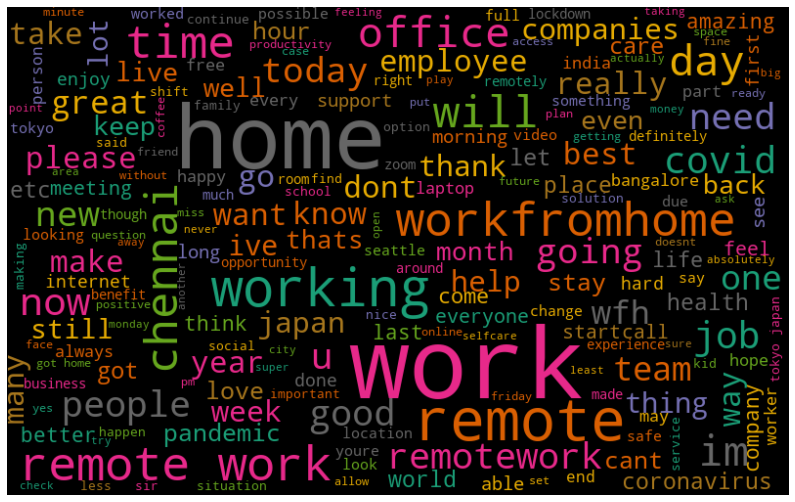

In [241]:
all_words = ' '.join([text for text in df_eng_clean['content'][df_eng_clean.sentiments == 1]])
generate_wordcloud(all_words)

#### Most common words in negative tweets

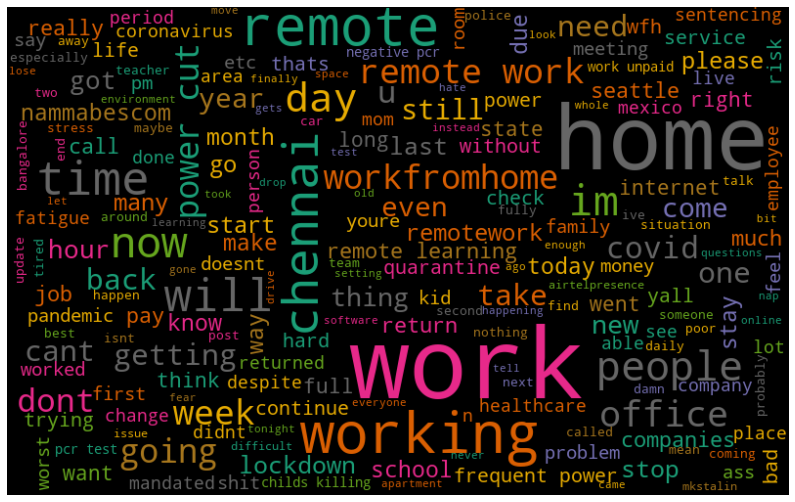

In [243]:
all_neg_words = ' '.join([text for text in df_eng_clean['content'][df_eng_clean.sentiments == -1]])
generate_wordcloud(all_neg_words)

#### Most common words in neutral tweets

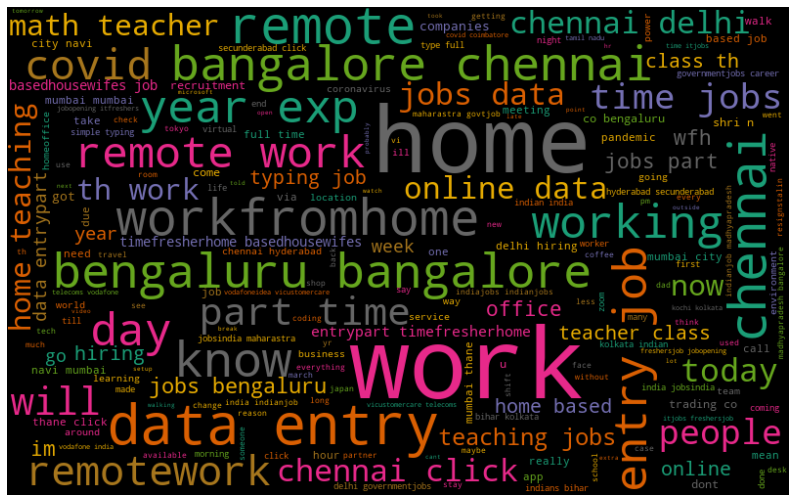

In [244]:
all_neu_words = ' '.join([text for text in df_eng_clean['content'][df_eng_clean.sentiments == 0]])
generate_wordcloud(all_neu_words)

In [317]:
df_eng_clean['polarity'] = df_eng_clean['sentiments']
df_eng_clean['sentiments'] = df_eng_clean['sentiments'].replace({1:'positive',0:'neutral', -1:'negative'})
df_eng_clean['polarity'] = df_eng_clean['polarity'].replace({'positive':2,'neutral':0, 'negative':1})

In [319]:
df_eng_clean.sentiments.value_counts()

positive    760
neutral     329
negative    321
Name: sentiments, dtype: int64

In [318]:
df_eng_clean.polarity.value_counts()

2    760
0    329
1    321
Name: polarity, dtype: int64

In [325]:
df_eng_clean.country.value_counts()

USA        643
India      445
Japan      174
Germany    148
Name: country, dtype: int64

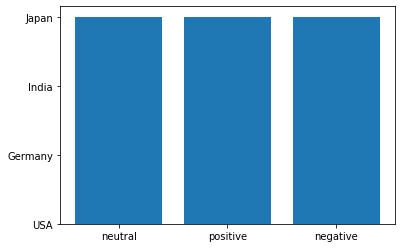

In [329]:
plt.bar(df_eng_clean.sentiments, df_eng_clean.country)
plt.show()

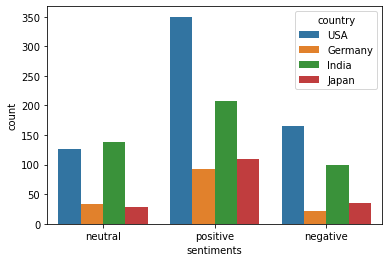

In [324]:
sns.countplot(x='sentiments',hue="country", data=df_eng_clean )
plt.show()

### Word Embeddings using Sentence BERT

In [278]:
model = SentenceTransformer('paraphrase-MiniLM-L6-v2')

#Our sentences we like to encode
sentences = ['This framework generates embeddings for each input sentence',
    'Sentences are passed as a list of string.',
    'The quick brown fox jumps over the lazy dog.']

#Sentences are encoded by calling model.encode()
embeddings = model.encode(sentences)

#Print the embeddings
for sentence, embedding in zip(sentences, embeddings):
    print("Sentence:", sentence)
    print("Embedding:", embedding)
    print("")

Downloading:   0%|          | 0.00/690 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/3.69k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/629 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/122 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/229 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/314 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Sentence: This framework generates embeddings for each input sentence
Embedding: [-1.76214442e-01  1.20601431e-01 -2.93623865e-01 -2.29858175e-01
 -8.22925866e-02  2.37709180e-01  3.39985192e-01 -7.80964613e-01
  1.18127480e-01  1.63374051e-01 -1.37715220e-01  2.40282401e-01
  4.25125599e-01  1.72417819e-01  1.05279602e-01  5.18164277e-01
  6.22215904e-02  3.99286479e-01 -1.81652397e-01 -5.85578859e-01
  4.49721813e-02 -1.72750100e-01 -2.68443465e-01 -1.47386134e-01
 -1.89217716e-01  1.92150697e-01 -3.83842170e-01 -3.96006882e-01
  4.30648834e-01 -3.15320164e-01  3.65949661e-01  6.05161637e-02
  3.57325703e-01  1.59736559e-01 -3.00983936e-01  2.63250351e-01
 -3.94311100e-01  1.84855863e-01 -3.99548799e-01 -2.67889738e-01
 -5.45117438e-01 -3.13407034e-02 -4.30643767e-01  1.33278042e-01
 -1.74794033e-01 -4.35465395e-01 -4.77379054e-01  7.12557584e-02
 -7.37001449e-02  5.69136798e-01 -2.82579482e-01  5.24974875e-02
 -8.20007861e-01  1.98296890e-01  1.69511825e-01  2.71780014e-01
  2.64610

In [286]:
df_eng_clean['content'][5]

'its so hot in seattle theyve decided to not open our studio building monday for our safety they told us to work from home or wherever we can find shelter since that announcement its now expected to be even hotter tuesday never had this happen at a job before'

In [281]:
sentences_list = []
for sent in df_eng_clean['content']:
    sentences_list.append(sent)

In [287]:
word_embeddings = []
#Sentences are encoded by calling model.encode()
embeddings = model.encode(sentences_list)

#Print the embeddings
for sentence, embedding in zip(sentences_list, embeddings):
    word_embeddings.append(embedding)

In [354]:
df_eng_clean['content_embeddings'] = word_embeddings

In [292]:
df_eng_clean.to_csv('WFH-tweets_english_clean.csv', sep=',', index=False)

In [7]:
cleaned_df = pd.read_csv('WFH-tweets_english_clean.csv')

In [59]:
cleaned_df['content_embeddings']

0       [ 2.94951051e-01 -2.15740845e-01  3.56519222e-...
1       [ 9.74271074e-02 -2.47539520e-01  5.57080925e-...
2       [ 7.56199509e-02  2.91682273e-01  1.19519241e-...
3       [-2.73747951e-01  1.16695531e-01  2.23515946e-...
4       [ 3.81139874e-01  2.05805540e-01  4.71804857e-...
                              ...                        
1405    [ 7.28416145e-02  2.66791612e-01 -2.32497901e-...
1406    [ 0.14342813  0.21905158  0.00822043 -0.078754...
1407    [-0.07896378 -0.09476763 -0.06954506 -0.230162...
1408    [-0.00367064 -0.02306548  0.07028096 -0.124976...
1409    [ 4.01110381e-01 -4.97798979e-01  8.31544623e-...
Name: content_embeddings, Length: 1410, dtype: object

In [8]:
cleaned_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1410 entries, 0 to 1409
Data columns (total 32 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   _type               1410 non-null   object 
 1   url                 1410 non-null   object 
 2   date                1410 non-null   object 
 3   content             1410 non-null   object 
 4   renderedContent     1410 non-null   object 
 5   id                  1410 non-null   int64  
 6   user                1410 non-null   object 
 7   replyCount          1410 non-null   int64  
 8   retweetCount        1410 non-null   int64  
 9   likeCount           1410 non-null   int64  
 10  quoteCount          1410 non-null   int64  
 11  conversationId      1410 non-null   int64  
 12  lang                1410 non-null   object 
 13  source              1410 non-null   object 
 14  sourceUrl           1410 non-null   object 
 15  sourceLabel         1410 non-null   object 
 16  outlin

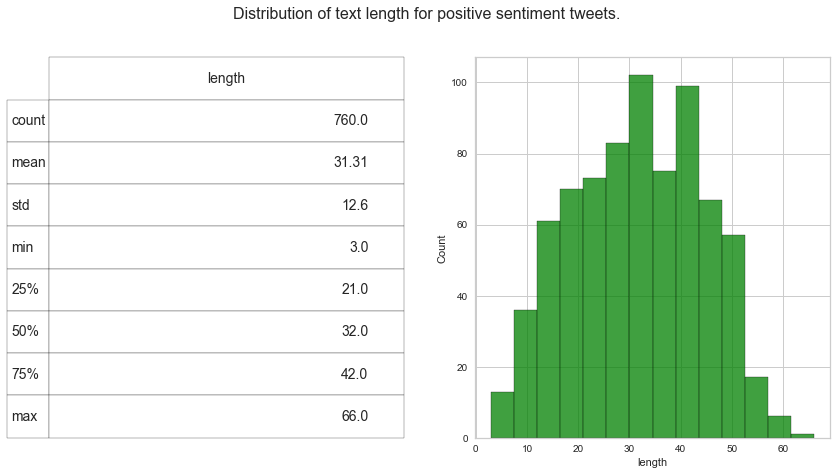

In [9]:
# Plotting the distribution of text length for positive sentiment tweets

fig = plt.figure(figsize=(14,7))
cleaned_df['length'] = cleaned_df.content.str.split().apply(len)
ax1 = fig.add_subplot(122)
sns.histplot(cleaned_df[cleaned_df['sentiments']== 1]['length'], ax=ax1,color='green')
describe = cleaned_df.length[cleaned_df.sentiments== 1].describe().to_frame().round(2)

ax2 = fig.add_subplot(121)
ax2.axis('off')
font_size = 14
bbox = [0, 0, 1, 1]
table = ax2.table(cellText = describe.values, rowLabels = describe.index, bbox=bbox, colLabels=describe.columns)
table.set_fontsize(font_size)
fig.suptitle('Distribution of text length for positive sentiment tweets.', fontsize=16)

plt.show()

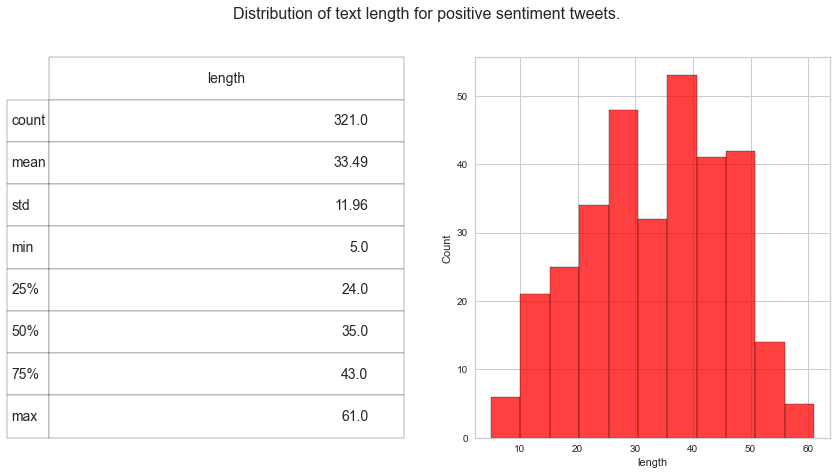

In [11]:
# Plotting the distribution of text length for negative sentiment tweets

fig = plt.figure(figsize=(14,7))
cleaned_df['length'] = cleaned_df.content.str.split().apply(len)
ax1 = fig.add_subplot(122)
sns.histplot(cleaned_df[cleaned_df['sentiments']== -1]['length'], ax=ax1,color='red')
describe = cleaned_df.length[cleaned_df.sentiments== -1].describe().to_frame().round(2)

ax2 = fig.add_subplot(121)
ax2.axis('off')
font_size = 14
bbox = [0, 0, 1, 1]
table = ax2.table(cellText = describe.values, rowLabels = describe.index, bbox=bbox, colLabels=describe.columns)
table.set_fontsize(font_size)
fig.suptitle('Distribution of text length for positive sentiment tweets.', fontsize=16)

plt.show()

In [56]:
fig = px.pie(cleaned_df, names='sentiments', title ='Pie chart of different sentiments of tweets')
fig.show()

In [45]:
hashtags_list = cleaned_df[cleaned_df.hashtags.notnull()]['hashtags'].tolist()
hashtags_list

["['seattleheatwave']",
 "['litterpick', 'cookstreetvillage', 'covid_19', 'WorkFromHome']",
 "['Seattle']",
 "['Seattle', 'everystepcounts']",
 "['mindyabusiness']",
 "['therapy', 'bodywork', 'mindbody', 'fitness', 'health', 'massage', 'WorkFromHome', 'fridaymorning']",
 "['health', 'arthritis', 'sports', 'Training', 'fitness', 'selfcare', 'WorkFromHome', 'tcm', 'yoga']",
 "['armyofthedead', 'Monday']",
 "['rehabpsych']",
 "['NBAPlayoffs', 'GNG', 'GRZNXTGEN', 'GrindCity']",
 "['neverstopworking', 'baseballlife']",
 "['GoPivotal', 'Business', 'Career', 'Job', 'Hiring', 'WorkWithUs', 'Consulting', 'WorkFromHome', 'Telecommute', 'Marketing', 'Producer', 'ProjectManager']",
 "['seattle', 'beautiful', 'nature', 'moment', 'pacific', 'ocean', 'sunset', 'CALM']",
 "['Easter2021', 'gold', 'sticker', 'etsy', 'WorkFromHome', 'stickerline', 'HappyEaster', 'CuteAnimals', 'rainboW', 'Latina', 'etsygifts']",
 "['microsoftlife']",
 "['seattle', 'COVID19', 'WorkFromHome', 'confluence']",
 "['TeamSprout

In [47]:
temp = []
for i in hashtags_list:
    i = i.replace('[','')
    i = i.replace(']','')
    i = i.replace("'",'')
    i = i.replace("'",'')
    i = i.split(',')
    temp.extend(i)
    
cleaned_hashtags_list = []
for i in temp:
    i = i.strip()
    cleaned_hashtags_list.append(i)
cleaned_hashtags_list

['seattleheatwave',
 'litterpick',
 'cookstreetvillage',
 'covid_19',
 'WorkFromHome',
 'Seattle',
 'Seattle',
 'everystepcounts',
 'mindyabusiness',
 'therapy',
 'bodywork',
 'mindbody',
 'fitness',
 'health',
 'massage',
 'WorkFromHome',
 'fridaymorning',
 'health',
 'arthritis',
 'sports',
 'Training',
 'fitness',
 'selfcare',
 'WorkFromHome',
 'tcm',
 'yoga',
 'armyofthedead',
 'Monday',
 'rehabpsych',
 'NBAPlayoffs',
 'GNG',
 'GRZNXTGEN',
 'GrindCity',
 'neverstopworking',
 'baseballlife',
 'GoPivotal',
 'Business',
 'Career',
 'Job',
 'Hiring',
 'WorkWithUs',
 'Consulting',
 'WorkFromHome',
 'Telecommute',
 'Marketing',
 'Producer',
 'ProjectManager',
 'seattle',
 'beautiful',
 'nature',
 'moment',
 'pacific',
 'ocean',
 'sunset',
 'CALM',
 'Easter2021',
 'gold',
 'sticker',
 'etsy',
 'WorkFromHome',
 'stickerline',
 'HappyEaster',
 'CuteAnimals',
 'rainboW',
 'Latina',
 'etsygifts',
 'microsoftlife',
 'seattle',
 'COVID19',
 'WorkFromHome',
 'confluence',
 'TeamSprout',
 'health

In [48]:
len(cleaned_hashtags_list)

2165

#### Most commonly used hashtags

In [53]:
def generate_hashtag_freqdist(hashtags):
    a = nltk.FreqDist(hashtags_list)
    d = pd.DataFrame({'Hashtag': list(a.keys()),
                      'Count': list(a.values())})
    # selecting top 15 most frequent hashtags     
    d = d.nlargest(columns="Count", n = 15)
    plt.figure(figsize=(16,7))
    ax = sns.barplot(data=d, x= "Hashtag", y = "Count")
    plt.xticks(rotation=80)
    ax.set(ylabel = 'Count')
    plt.show()

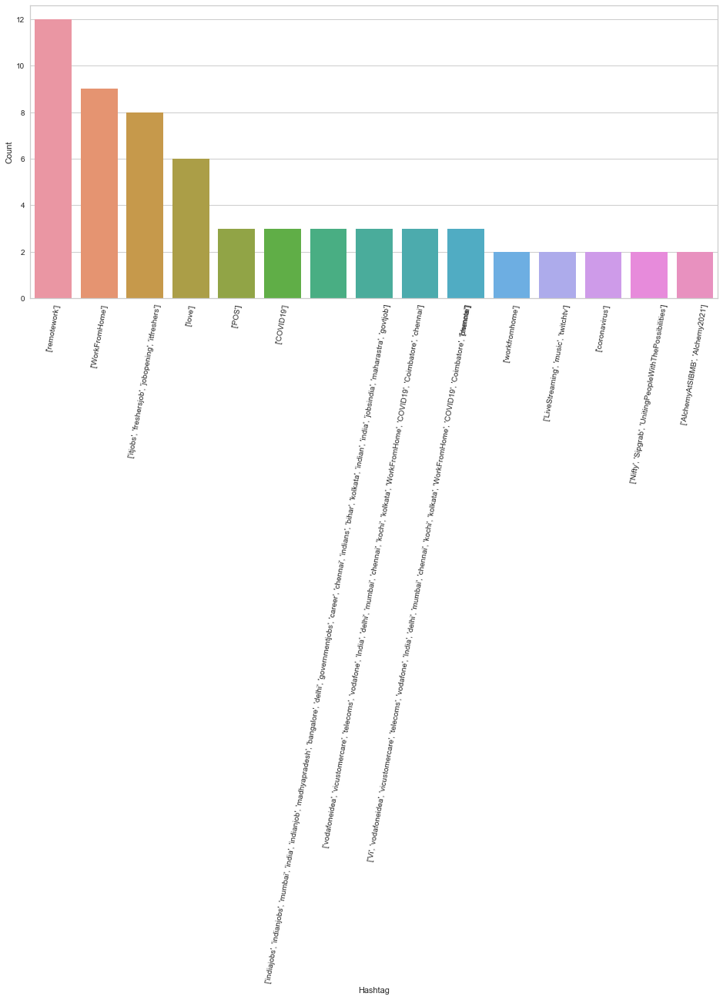

In [54]:
generate_hashtag_freqdist(cleaned_hashtags_list)

In [299]:
cleaned_df['location'] = cleaned_df['country'].copy()

In [302]:
cleaned_df = pd.get_dummies(cleaned_df, columns=['country'])

In [13]:
model = SentenceTransformer('paraphrase-MiniLM-L6-v2')

sentences_list = []
for sent in cleaned_df['content']:
    sentences_list.append(sent)
    
sent_embeddings = []
#Sentences are encoded by calling model.encode()
embeddings = model.encode(sentences_list)

#Print the embeddings
for sentence, embedding in zip(sentences_list, embeddings):
    sent_embeddings.append(embedding)

In [14]:
sent_embeddings

[array([ 2.94951051e-01, -2.15740845e-01,  3.56519222e-01,  1.03140724e+00,
         1.24337804e+00, -6.41306341e-01,  4.76650089e-01, -1.98123530e-01,
         2.23353412e-02, -6.90721810e-01, -1.65527254e-01, -4.34953958e-01,
        -4.44158763e-01, -7.37174973e-02,  2.83923596e-01, -4.75136518e-01,
         4.61833440e-02, -7.75256217e-01, -1.22153880e-02,  2.14167476e-01,
        -4.34784293e-01, -5.64154387e-02,  2.55214155e-01, -3.08037270e-02,
         1.18636794e-01,  7.28933096e-01,  3.54693145e-01, -4.96889561e-01,
        -2.25787938e-01,  2.03939497e-01,  2.06934646e-01, -4.21202451e-01,
         1.44724697e-02,  2.77573839e-02,  3.62781614e-01, -6.64395094e-02,
         2.00790286e-01, -9.10648704e-02,  2.53194332e-01,  3.22787255e-01,
        -8.35531726e-02, -1.92147475e-02,  7.19322413e-02,  1.53872073e-01,
        -7.58121675e-03,  3.58934969e-01,  5.25908649e-01,  6.36807978e-02,
         5.72593324e-02,  2.37865254e-01,  6.59507215e-02, -3.25161576e-01,
         3.0

In [15]:
# Split the y variable series and x variables dataset
X = sent_embeddings
y = cleaned_df['sentiments']

In [16]:
# Split the dataset into the training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

### Random Forest

In [17]:
rf = RandomForestClassifier()
rf.fit(X_train, y_train)

RandomForestClassifier()

In [27]:
rf.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [18]:
# Define a function to compute various evaluation metrics 
def compute_evaluation_metric(model, x_test, y_actual, y_predicted, y_predicted_prob):
    print("\n Accuracy Score : \n ",accuracy_score(y_actual,y_predicted))
    print("\n AUC Score : \n", roc_auc_score(y_actual, y_predicted_prob, multi_class='ovr'))
    print("\n Confusion Matrix : \n ",confusion_matrix(y_actual, y_predicted))
    print("\n Classification Report : \n",classification_report(y_actual, y_predicted))

In [19]:
compute_evaluation_metric(rf, X_test, y_test, rf.predict(X_test), rf.predict_proba(X_test))


 Accuracy Score : 
  0.6914893617021277

 AUC Score : 
 0.8054024922477802

 Confusion Matrix : 
  [[  9   4  39]
 [  2  22  37]
 [  1   4 164]]

 Classification Report : 
               precision    recall  f1-score   support

          -1       0.75      0.17      0.28        52
           0       0.73      0.36      0.48        61
           1       0.68      0.97      0.80       169

    accuracy                           0.69       282
   macro avg       0.72      0.50      0.52       282
weighted avg       0.71      0.69      0.64       282



In [20]:
def plot_ROC_curve(model, xtrain, ytrain, xtest, ytest):

    # Creating visualization with the readable labels
    visualizer = ROCAUC(model, encoder={0: 'neutral', 
                                        1: 'positive', 
                                        -1: 'negative'})
                                        
    # Fitting to the training data first then scoring with the test data                                    
    visualizer.fit(xtrain, ytrain)
    visualizer.score(xtest, ytest)
    visualizer.show()
    
    return visualizer

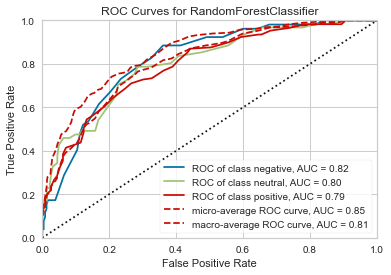

ROCAUC(ax=<AxesSubplot:title={'center':'ROC Curves for RandomForestClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={-1: 'negative', 0: 'neutral', 1: 'positive'},
       estimator=RandomForestClassifier())

In [21]:
plot_ROC_curve(rf, X_train, y_train, X_test, y_test)

#### Hyperparameter Tuning

In [32]:
# Parameters for Random Forest
param_grid_random_forest = {'max_depth'   : [None,10,20,40,100],
                            'n_estimators' : [10,30,50,100,150],
                            'min_samples_leaf' : [1,2,3,4],
                            'min_samples_split' : [1,2,3,5],
                            'max_features' : ['auto'],
                            'oob_score' : [bool],
                            'criterion' : ['gini', 'entropy'],
                            'bootstrap' : [True]
                           }

# Run grid search 
grid = GridSearchCV(rf, param_grid_random_forest, verbose = 3, n_jobs = -1) 
  
# fit the model for grid search 
grid.fit(X_train, y_train)

Fitting 5 folds for each of 800 candidates, totalling 4000 fits


GridSearchCV(estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'bootstrap': [True], 'criterion': ['gini', 'entropy'],
                         'max_depth': [None, 10, 20, 40, 100],
                         'max_features': ['auto'],
                         'min_samples_leaf': [1, 2, 3, 4],
                         'min_samples_split': [1, 2, 3, 5],
                         'n_estimators': [10, 30, 50, 100, 150],
                         'oob_score': [<class 'bool'>]},
             verbose=3)

In [33]:
# Find the best estimators
best_rf = grid.best_estimator_

# fit XGB classifier with best parameters
best_rf.fit(X_train, y_train)

RandomForestClassifier(max_depth=100, min_samples_leaf=3, min_samples_split=5,
                       n_estimators=50, oob_score=<class 'bool'>)

In [34]:
compute_evaluation_metric(best_rf, X_test, y_test, best_rf.predict(X_test), best_rf.predict_proba(X_test))


 Accuracy Score : 
  0.6702127659574468

 AUC Score : 
 0.7851823324454772

 Confusion Matrix : 
  [[ 10   2  40]
 [  3  20  38]
 [  4   6 159]]

 Classification Report : 
               precision    recall  f1-score   support

          -1       0.59      0.19      0.29        52
           0       0.71      0.33      0.45        61
           1       0.67      0.94      0.78       169

    accuracy                           0.67       282
   macro avg       0.66      0.49      0.51       282
weighted avg       0.67      0.67      0.62       282



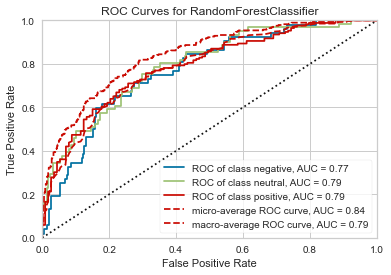

ROCAUC(ax=<AxesSubplot:title={'center':'ROC Curves for RandomForestClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={-1: 'negative', 0: 'neutral', 1: 'positive'},
       estimator=RandomForestClassifier(max_depth=100, min_samples_leaf=3,
                                        min_samples_split=5, n_estimators=50,
                                        oob_score=<class 'bool'>))

In [35]:
plot_ROC_curve(best_rf, X_train, y_train, X_test, y_test)

In [163]:
# save
joblib.dump(best_rf, "./random_forest.joblib")

['./random_forest.joblib']

In [ ]:
# load, no need to initialize the loaded_rf
# loaded_rf = joblib.load("./random_forest.joblib")

### XGBoost

In [106]:
xgb = XGBClassifier(verbosity = 0)
xgb.fit(X_train, y_train)
xgb.get_params()

{'objective': 'multi:softprob',
 'use_label_encoder': True,
 'base_score': 0.5,
 'booster': 'gbtree',
 'colsample_bylevel': 1,
 'colsample_bynode': 1,
 'colsample_bytree': 1,
 'enable_categorical': False,
 'gamma': 0,
 'gpu_id': -1,
 'importance_type': None,
 'interaction_constraints': '',
 'learning_rate': 0.300000012,
 'max_delta_step': 0,
 'max_depth': 6,
 'min_child_weight': 1,
 'missing': nan,
 'monotone_constraints': '()',
 'n_estimators': 100,
 'n_jobs': 16,
 'num_parallel_tree': 1,
 'predictor': 'auto',
 'random_state': 0,
 'reg_alpha': 0,
 'reg_lambda': 1,
 'scale_pos_weight': None,
 'subsample': 1,
 'tree_method': 'exact',
 'validate_parameters': 1,
 'verbosity': 0}

In [108]:
compute_evaluation_metric(xgb, X_test, y_test, xgb.predict(X_test), xgb.predict_proba(X_test))


 Accuracy Score : 
  0.6595744680851063

 AUC Score : 
 0.8145360976732808

 Confusion Matrix : 
  [[ 14   9  29]
 [  5  23  33]
 [  8  12 149]]

 Classification Report : 
               precision    recall  f1-score   support

          -1       0.52      0.27      0.35        52
           0       0.52      0.38      0.44        61
           1       0.71      0.88      0.78       169

    accuracy                           0.66       282
   macro avg       0.58      0.51      0.53       282
weighted avg       0.63      0.66      0.63       282



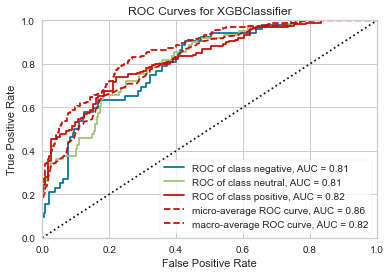

ROCAUC(ax=<AxesSubplot:title={'center':'ROC Curves for XGBClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={-1: 'negative', 0: 'neutral', 1: 'positive'},
       estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                               colsample_bylevel=1, colsample_bynode=1,
                               colsample_bytree=1, enable_categorical=False,
                               gamma=0, gpu_id=-1, importance_type=None,
                               i...on_constraints='',
                               learning_rate=0.300000012, max_delta_step=0,
                               max_depth=6, min_child_weight=1, missing=nan,
                               monotone_constraints='()', n_estimators=100,
                               n_jobs=16, num_parallel_tree=1,
                               objective='multi:softprob', predictor='auto',
                               random_state=0, reg_alpha=0, reg_lambda=1,
                      

In [109]:
plot_ROC_curve(xgb, X_train, y_train, X_test, y_test)

#### Hyperparameter Tuning

In [110]:
param_grid_xgb = {'min_child_weight': [1, 5, 10],
                  'gamma': [0, 1],
                  'max_depth': [5,10],
                  'learning_rate' : [0.05,0.1]
                 }

# Run grid search 
grid = GridSearchCV(xgb, param_grid_xgb, verbose = 3, n_jobs = -1) 
  
# fit the model for grid search 
grid.fit(X_train, y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


GridSearchCV(estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1,
                                     enable_categorical=False, gamma=0,
                                     gpu_id=-1, importance_type=None,
                                     interaction_constraints='',
                                     learning_rate=0.300000012,
                                     max_delta_step=0, max_depth=6,
                                     min_child_weight=1, missing=nan,
                                     monotone_constraints='()',
                                     n_estimators=100, n_jobs=16,
                                     num_parallel_tree=1,
                                     objective='multi:softprob',
                                     predictor='auto', random_state=0,
                                     reg_alpha=0, reg_lambda=

In [111]:
# Find the best estimators
best_xgb = grid.best_estimator_

# fit XGB classifier with best parameters
best_xgb.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=1, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.1, max_delta_step=0,
              max_depth=10, min_child_weight=10, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=16,
              num_parallel_tree=1, objective='multi:softprob', predictor='auto',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=None,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=0)

In [112]:
compute_evaluation_metric(best_xgb, X_test, y_test, best_xgb.predict(X_test), best_xgb.predict_proba(X_test))


 Accuracy Score : 
  0.6666666666666666

 AUC Score : 
 0.8134943874150243

 Confusion Matrix : 
  [[ 14   5  33]
 [  4  25  32]
 [ 11   9 149]]

 Classification Report : 
               precision    recall  f1-score   support

          -1       0.48      0.27      0.35        52
           0       0.64      0.41      0.50        61
           1       0.70      0.88      0.78       169

    accuracy                           0.67       282
   macro avg       0.61      0.52      0.54       282
weighted avg       0.64      0.67      0.64       282



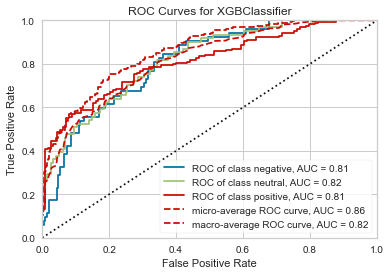

ROCAUC(ax=<AxesSubplot:title={'center':'ROC Curves for XGBClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={-1: 'negative', 0: 'neutral', 1: 'positive'},
       estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                               colsample_bylevel=1, colsample_bynode=1,
                               colsample_bytree=1, enable_categorical=False,
                               gamma=1, gpu_id=-1, importance_type=None,
                               interaction_constraints='', learning_rate=0.1,
                               max_delta_step=0, max_depth=10,
                               min_child_weight=10, missing=nan,
                               monotone_constraints='()', n_estimators=100,
                               n_jobs=16, num_parallel_tree=1,
                               objective='multi:softprob', predictor='auto',
                               random_state=0, reg_alpha=0, reg_lambda=1,
                       

In [113]:
plot_ROC_curve(best_xgb, X_train, y_train, X_test, y_test)

In [164]:
# save
joblib.dump(best_xgb, "./xgboost.joblib")

['./xgboost.joblib']

### SVM

In [72]:
svm = SVC(probability = True)
svm.fit(X_train, y_train)
svm.get_params()

{'C': 1.0,
 'break_ties': False,
 'cache_size': 200,
 'class_weight': None,
 'coef0': 0.0,
 'decision_function_shape': 'ovr',
 'degree': 3,
 'gamma': 'scale',
 'kernel': 'rbf',
 'max_iter': -1,
 'probability': True,
 'random_state': None,
 'shrinking': True,
 'tol': 0.001,
 'verbose': False}

In [73]:
compute_evaluation_metric(svm, X_test, y_test, svm.predict(X_test), svm.predict_proba(X_test))


 Accuracy Score : 
  0.6950354609929078

 AUC Score : 
 0.8319232015491475

 Confusion Matrix : 
  [[ 17   6  29]
 [  4  29  28]
 [  7  12 150]]

 Classification Report : 
               precision    recall  f1-score   support

          -1       0.61      0.33      0.42        52
           0       0.62      0.48      0.54        61
           1       0.72      0.89      0.80       169

    accuracy                           0.70       282
   macro avg       0.65      0.56      0.59       282
weighted avg       0.68      0.70      0.67       282



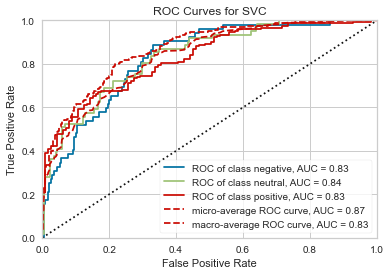

ROCAUC(ax=<AxesSubplot:title={'center':'ROC Curves for SVC'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={-1: 'negative', 0: 'neutral', 1: 'positive'},
       estimator=SVC(probability=True))

In [74]:
plot_ROC_curve(svm, X_train, y_train, X_test, y_test)

#### Hyperparameter Tuning

In [86]:
# defining parameter range
param_grid_svm = {'C': [0.1, 1, 10, 100, 1000],
                 'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                 'kernel': ['linear', 'poly', 'rbf', 'sigmoid']}
 
grid = GridSearchCV(SVC(probability=True), param_grid_svm, refit = True, verbose = 3, n_jobs = -1)
 
# fitting the model for grid search
grid.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


GridSearchCV(estimator=SVC(probability=True), n_jobs=-1,
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['linear', 'poly', 'rbf', 'sigmoid']},
             verbose=3)

In [87]:
# Find the best estimators
best_svm = grid.best_estimator_

# fit XGB classifier with best parameters
best_svm.fit(X_train, y_train)

SVC(C=10, gamma=0.01, probability=True)

In [88]:
compute_evaluation_metric(best_svm, X_test, y_test, best_svm.predict(X_test), best_svm.predict_proba(X_test))


 Accuracy Score : 
  0.7269503546099291

 AUC Score : 
 0.8567667727965289

 Confusion Matrix : 
  [[ 30   7  15]
 [  8  38  15]
 [ 17  15 137]]

 Classification Report : 
               precision    recall  f1-score   support

          -1       0.55      0.58      0.56        52
           0       0.63      0.62      0.63        61
           1       0.82      0.81      0.82       169

    accuracy                           0.73       282
   macro avg       0.67      0.67      0.67       282
weighted avg       0.73      0.73      0.73       282



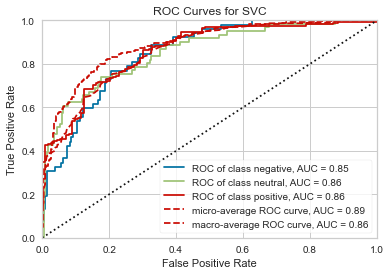

ROCAUC(ax=<AxesSubplot:title={'center':'ROC Curves for SVC'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={-1: 'negative', 0: 'neutral', 1: 'positive'},
       estimator=SVC(C=10, gamma=0.01, probability=True))

In [90]:
plot_ROC_curve(best_svm, X_train, y_train, X_test, y_test)

In [165]:
# save
joblib.dump(best_svm, "./support_vector_machines.joblib")

['./support_vector_machines.joblib']

### Stacking CV Classifier

In [119]:
sclf = StackingCVClassifier(classifiers=[best_rf, best_xgb], meta_classifier=best_svm, use_probas = True, use_features_in_secondary = True, random_state = 42)

print('10-fold cross validation:\n')

for clf, label in zip([best_rf, best_xgb, sclf],
                     ['Random Forest', 'XGBoost', 'Stacking Classifier']):
    clf.fit(X, y)
    scores = model_selection.cross_val_score(clf, X_train, y_train, 
                                              cv=10, scoring='roc_auc_ovr')
    print("ROCAUC: %0.2f (+/- %0.2f) [%s]" 
          % (scores.mean(), scores.std(), label))

10-fold cross validation:

ROCAUC: 0.79 (+/- 0.03) [Random Forest]
ROCAUC: 0.80 (+/- 0.02) [XGBoost]
ROCAUC: 0.82 (+/- 0.03) [Stacking Classifier]


In [120]:
compute_evaluation_metric(sclf, X_test, y_test, sclf.predict(X_test), sclf.predict_proba(X_test))


 Accuracy Score : 
  0.9468085106382979

 AUC Score : 
 0.994374528818847

 Confusion Matrix : 
  [[ 46   1   5]
 [  2  55   4]
 [  2   1 166]]

 Classification Report : 
               precision    recall  f1-score   support

          -1       0.92      0.88      0.90        52
           0       0.96      0.90      0.93        61
           1       0.95      0.98      0.97       169

    accuracy                           0.95       282
   macro avg       0.94      0.92      0.93       282
weighted avg       0.95      0.95      0.95       282



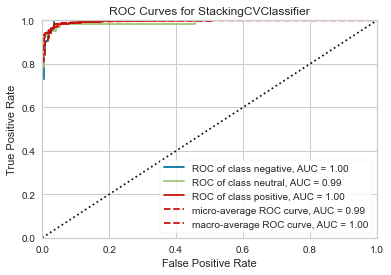

ROCAUC(ax=<AxesSubplot:title={'center':'ROC Curves for StackingCVClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={-1: 'negative', 0: 'neutral', 1: 'positive'},
       estimator=StackingCVClassifier(classifiers=[RandomForestClassifier(max_depth=100,
                                                                          min_samples_leaf=3,
                                                                          min_samples_split=5,
                                                                          n_estimators=50,
                                                                          oob_score=<class 'bool'>),
                                                   XGBClassifi...
                                                                 monotone_constraints='()',
                                                                 n_estimators=100,
                                                                 n_jobs=16,
            

In [121]:
plot_ROC_curve(sclf, X_train, y_train, X_test, y_test)

In [166]:
# save
joblib.dump(sclf, "./stacking_classifier.joblib")

['./stacking_classifier.joblib']

## Test Data Generation
The code below will scrape for 500 tweets between August 1st, 2021 and Jan 31st, 2022, by a text search then provide a CSV file with Pandas

In [122]:
# Setting variables to be used in format string command below
tweet_count = 500
text_query = "work from home"
since_date = "2021-08-01"
until_date = "2022-01-31"

# Using OS library to call CLI commands in Python
os.system('snscrape --jsonl --max-results {} --since {} twitter-search "{} until:{}"> text-query-tweets.json'.format(tweet_count, since_date, text_query, until_date))

# Reads the json generated from the CLI command above and creates a pandas dataframe
tweets_test = pd.read_json('text-query-tweets.json', lines=True)

print(f'Shape of tweets_test : {tweets_test.shape}')

# Displays first 5 entries from dataframe
tweets_test.head()

Shape of tweets_test : (500, 29)


,_type,url,date,content,renderedContent,id,user,replyCount,retweetCount,likeCount,...,retweetedTweet,quotedTweet,inReplyToTweetId,inReplyToUser,mentionedUsers,coordinates,place,hashtags,cashtags,card
0,snscrape.modules.twitter.Tweet,https://twitter.com/MerryMegsy/status/14879386...,2022-01-30 23:59:48+00:00,I love how they talk about the mental health o...,I love how they talk about the mental health o...,1487938627661606917,"{'_type': 'snscrape.modules.twitter.User', 'us...",2,0,3,...,NaN,None,NaN,None,None,None,None,None,NaN,None
1,snscrape.modules.twitter.Tweet,https://twitter.com/Zwanguy/status/14879384723...,2022-01-30 23:59:11+00:00,"And, now I get to go home 4 hours early from w...","And, now I get to go home 4 hours early from w...",1487938472329498627,"{'_type': 'snscrape.modules.twitter.User', 'us...",2,0,15,...,NaN,None,NaN,None,None,{'_type': 'snscrape.modules.twitter.Coordinate...,"{'_type': 'snscrape.modules.twitter.Place', 'f...",None,NaN,None
2,snscrape.modules.twitter.Tweet,https://twitter.com/BerniceRinas/status/148793...,2022-01-30 23:59:09+00:00,@TPostMillennial What? Triggered ? She needs a...,@TPostMillennial What? Triggered ? She needs a...,1487938467845840898,"{'_type': 'snscrape.modules.twitter.User', 'us...",0,0,0,...,NaN,None,1.487893e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...","[{'_type': 'snscrape.modules.twitter.User', 'u...",None,None,None,NaN,None
3,snscrape.modules.twitter.Tweet,https://twitter.com/tiredrenny/status/14879384...,2022-01-30 23:59:08+00:00,i love how i get home from work and want food ...,i love how i get home from work and want food ...,1487938461822865412,"{'_type': 'snscrape.modules.twitter.User', 'us...",0,0,0,...,NaN,None,NaN,None,None,None,None,None,NaN,None
4,snscrape.modules.twitter.Tweet,https://twitter.com/DavikaHill/status/14879384...,2022-01-30 23:58:57+00:00,"@elizabethvarao I live with my mom, I come hom...","@elizabethvarao I live with my mom, I come hom...",1487938413953179649,"{'_type': 'snscrape.modules.twitter.User', 'us...",0,0,0,...,NaN,None,1.487813e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...","[{'_type': 'snscrape.modules.twitter.User', 'u...",None,None,None,NaN,None


### Test Data Pre-Processing

In [139]:
# Lowercase
tweets_test['content'] = tweets_test.content.str.lower()

# Removing URL links
tweets_test.content = tweets_test.content.apply(lambda x: re.sub(r'https?:\/\/\S+', '', x))
tweets_test.content.apply(lambda x: re.sub(r"www\.[a-z]?\.?(com)+|[a-z]+\.(com)", '', x))

tweets_test = tweets_test.reset_index()
tweets_test.drop(['index'],axis=1,inplace=True)

# Removing HTML reference characters
tweets_test['content'] = tweets_test['content'].apply(lambda x: re.sub(r'&[a-z]+;', '', x))

# Removing Non-letter characters
tweets_test['content'] = tweets_test['content'].apply(lambda x: re.sub(r"[^a-z\s\(\-:\)\\\/\];='#]", '', x))

# Removing punctuations, numbers and special characters
tweets_test['content'] = tweets_test['content'].str.replace("[^a-zA-Z# ]", "")

In [167]:
# Export dataframe into a CSV
tweets_test.to_csv('Tweets-Test_Set.csv', sep=',', index=False)

In [142]:
model = SentenceTransformer('paraphrase-MiniLM-L6-v2')

test_sentences_list = []
for sent in tweets_test['content']:
    test_sentences_list.append(sent)
    
test_sent_embeddings = []
#Sentences are encoded by calling model.encode()
embeddings = model.encode(test_sentences_list)

#Print the embeddings
for sentence, embedding in zip(test_sentences_list, embeddings):
    test_sent_embeddings.append(embedding)

In [144]:
X_TEST = test_sent_embeddings

In [153]:
test_predictions = best_svm.predict(X_TEST)

In [147]:
test_sentiments = tweets_test['content'].apply(sentiment_scores)

Overall sentiment dictionary is :  {'neg': 0.071, 'neu': 0.799, 'pos': 0.13, 'compound': 0.6371}
sentence was rated as  7.1 % Negative
sentence was rated as  79.9 % Neutral
sentence was rated as  13.0 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.906, 'pos': 0.094, 'compound': 0.4404}
sentence was rated as  0.0 % Negative
sentence was rated as  90.60000000000001 % Neutral
sentence was rated as  9.4 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.104, 'neu': 0.896, 'pos': 0.0, 'compound': -0.296}
sentence was rated as  10.4 % Negative
sentence was rated as  89.60000000000001 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.137, 'neu': 0.67, 'pos': 0.193, 'compound': 0.0219}
sentence was rated as  13.700000000000001 % Negative
sentence was rated as  67.0 % Neutral
sentence was rated as  19.3 % Positive
Sentence 

Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.917, 'pos': 0.083, 'compound': 0.4215}
sentence was rated as  0.0 % Negative
sentence was rated as  91.7 % Neutral
sentence was rated as  8.3 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.046, 'neu': 0.807, 'pos': 0.147, 'compound': 0.7783}
sentence was rated as  4.6 % Negative
sentence was rated as  80.7 % Neutral
sentence was rated as  14.7 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is

Overall sentiment dictionary is :  {'neg': 0.077, 'neu': 0.767, 'pos': 0.156, 'compound': 0.4767}
sentence was rated as  7.7 % Negative
sentence was rated as  76.7 % Neutral
sentence was rated as  15.6 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.056, 'neu': 0.786, 'pos': 0.158, 'compound': 0.6027}
sentence was rated as  5.6000000000000005 % Negative
sentence was rated as  78.60000000000001 % Neutral
sentence was rated as  15.8 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.091, 'neu': 0.827, 'pos': 0.082, 'compound': -0.1396}
sentence was rated as  9.1 % Negative
sentence was rated as  82.69999999999999 % Neutral
sentence was rated as  8.200000000000001 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.722, 'pos': 0.278, 'compound': 0.8074}
sentence was rated as  0.0 % Negative
sentence was rated as  72.2 % Neutral
sentence was rated as  27.800

Overall sentiment dictionary is :  {'neg': 0.128, 'neu': 0.872, 'pos': 0.0, 'compound': -0.5859}
sentence was rated as  12.8 % Negative
sentence was rated as  87.2 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.783, 'pos': 0.217, 'compound': 0.3612}
sentence was rated as  0.0 % Negative
sentence was rated as  78.3 % Neutral
sentence was rated as  21.7 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.123, 'neu': 0.663, 'pos': 0.214, 'compound': 0.25}
sentence was rated as  12.3 % Negative
sentence was rated as  66.3 % Neutral
sentence was rated as  21.4 % Positive
Sentence Overall Rated As Positive
Overall sentiment dict

Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.805, 'pos': 0.195, 'compound': 0.4404}
sentence was rated as  0.0 % Negative
sentence was rated as  80.5 % Neutral
sentence was rated as  19.5 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overal

Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.039, 'neu': 0.83, 'pos': 0.131, 'compound': 0.7308}
sentence was rated as  3.9 % Negative
sentence was rated as  83.0 % Neutral
sentence was rated as  13.100000000000001 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.039, 'neu': 0.83, 'pos': 0.131, 'compound': 0.7308}
sentence was rated as  3.9 % Negative
sentence was rated as  83.0 % Neutral
sentence was rated as  13.100000000000001 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Ov

sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.07, 'neu': 0.783, 'pos': 0.147, 'compound': 0.6935}
sentence was rated as  7.000000000000001 % Negative
sentence was rated as  78.3 % Neutral
sentence was rated as  14.7 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.234, 'neu': 0.766, 'pos': 0.0, 'compound': -0.5994}
sentence was rated as  23.400000000000002 % Negative
sentence was rated as  76.6 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.031, 'neu': 0.764, 'pos': 0.205, 'compound': 0.8462}
sentence was rated as  3.1 % Negative
sentence was rated as  76.4 % Neutral
sentence was rated as  20.5 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.146, 'neu': 0.639, 'pos': 0.216, 'co

sentence was rated as  14.299999999999999 % Negative
sentence was rated as  75.0 % Neutral
sentence was rated as  10.7 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.035, 'neu': 0.965, 'pos': 0.0, 'compound': -0.128}
sentence was rated as  3.5000000000000004 % Negative
sentence was rated as  96.5 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.112, 'neu': 0.691, 'pos': 0.197, 'compound': 0.3798}
s

Overall sentiment dictionary is :  {'neg': 0.035, 'neu': 0.73, 'pos': 0.236, 'compound': 0.8575}
sentence was rated as  3.5000000000000004 % Negative
sentence was rated as  73.0 % Neutral
sentence was rated as  23.599999999999998 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.068, 'neu': 0.932, 'pos': 0.0, 'compound': -0.2617}
sentence was rated as  6.800000000000001 % Negative
sentence was rated as  93.2 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.802, 'pos': 0.198, 'compound': 0.5719}
sentence was rated as  0.0 % Negative
sentence was rated as  80.2 % Neutral
sentence was rated as  19.8 % Positive
Sentence Overal

Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.145, 'neu': 0.745, 'pos': 0.11, 'compound': -0.413}
sentence was rated as  14.499999999999998 % Negative
sentence was rated as  74.5 % Neutral
sentence was rated as  11.0 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.782, 'pos': 0.218, 'compound': 0.6948}
sentence was rated as  0.0 % Negative
sentence was rated as  78.2 % Neutral
sentence was rated as  21.8 % Positive
Sentence Overall Rated As Positive
Overall sentimen

sentence was rated as  92.80000000000001 % Neutral
sentence was rated as  7.199999999999999 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.951, 'pos': 0.049, 'compound': 0.3818}
sentence was rated as  0.0 % Negative
sentence was r

Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 0.672, 'pos': 0.328, 'compound': 0.7783}
sentence was rated as  0.0 % Negative
sentence was rated as  67.2 % Neutral
sentence was rated as  32.800000000000004 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is :  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sentence was rated as  0.0 % Negative
sentence was rated as  100.0 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is :  {'neg': 0.133, 'neu': 0.708, 'pos': 0.159, 'compound': -0.128}
sentence was rated as  13.3 % Negative
sentence was rated as  70.8 % Neutral
sentence was rated as  15.9 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is :  {'neg': 0.068, 'neu': 0.847, 'pos': 0.085, 'compound': 0.1531}
sentence was rated as  6.800000000000001 % Negative
sentence was rated as  84.7 % Neutral
sentence was rated as  8.5 % Positive
Sentence Overall Rated As P

In [148]:
test_sentiments

0      positive
1      positive
2      negative
3       neutral
4      positive
         ...   
495    positive
496    negative
497    positive
498    positive
499    positive
Name: content, Length: 500, dtype: object

In [151]:
test_sentiments = test_sentiments.replace({'positive':1,'neutral':0, 'negative':-1})

In [60]:
print('Train data sentiments from Vader')
cleaned_df['sentiments'].value_counts()

Train data sentiments from Vader


 1    760
 0    329
-1    321
Name: sentiments, dtype: int64

In [157]:
print('Test Data Sentiments from Vader:')
print(test_sentiments.value_counts())
print()
print('Test Data predictions by the classifier:')
print(pd.value_counts(test_predictions))

Test Data Sentiments from Vader:
 1    235
 0    144
-1    121
Name: content, dtype: int64

Test Data predictions by the classifier:
 1    282
-1    112
 0    106
dtype: int64


### Metrics of Test Predictions using SVM Classifier

In [169]:
print("\n Accuracy Score : \n ",accuracy_score(test_sentiments,test_predictions))
print("\n AUC Score : \n", roc_auc_score(test_sentiments, best_svm.predict_proba(X_TEST), multi_class='ovr'))
print("\n Confusion Matrix : \n ",confusion_matrix(test_sentiments, test_predictions))
print("\n Classification Report : \n",classification_report(test_sentiments, test_predictions))


 Accuracy Score : 
  0.628

 AUC Score : 
 0.8122466743309698

 Confusion Matrix : 
  [[ 60  11  50]
 [ 20  73  51]
 [ 32  22 181]]

 Classification Report : 
               precision    recall  f1-score   support

          -1       0.54      0.50      0.52       121
           0       0.69      0.51      0.58       144
           1       0.64      0.77      0.70       235

    accuracy                           0.63       500
   macro avg       0.62      0.59      0.60       500
weighted avg       0.63      0.63      0.62       500



### Metrics of Test Predictions using XGBoost Classifier

In [171]:
print("\n Accuracy Score : \n ",accuracy_score(test_sentiments,best_xgb.predict(X_TEST)))
print("\n AUC Score : \n", roc_auc_score(test_sentiments, best_xgb.predict_proba(X_TEST), multi_class='ovr'))
print("\n Confusion Matrix : \n ",confusion_matrix(test_sentiments, best_xgb.predict(X_TEST)))
print("\n Classification Report : \n",classification_report(test_sentiments, best_xgb.predict(X_TEST)))


 Accuracy Score : 
  0.61

 AUC Score : 
 0.7912747637999815

 Confusion Matrix : 
  [[ 50   5  66]
 [ 16  51  77]
 [ 21  10 204]]

 Classification Report : 
               precision    recall  f1-score   support

          -1       0.57      0.41      0.48       121
           0       0.77      0.35      0.49       144
           1       0.59      0.87      0.70       235

    accuracy                           0.61       500
   macro avg       0.65      0.55      0.56       500
weighted avg       0.64      0.61      0.59       500



### Metrics of Test Predictions using Random Forest Classifier

In [172]:
print("\n Accuracy Score : \n ",accuracy_score(test_sentiments,best_rf.predict(X_TEST)))
print("\n AUC Score : \n", roc_auc_score(test_sentiments, best_rf.predict_proba(X_TEST), multi_class='ovr'))
print("\n Confusion Matrix : \n ",confusion_matrix(test_sentiments, best_rf.predict(X_TEST)))
print("\n Classification Report : \n",classification_report(test_sentiments, best_rf.predict(X_TEST)))


 Accuracy Score : 
  0.55

 AUC Score : 
 0.7638559480958448

 Confusion Matrix : 
  [[ 26   2  93]
 [  9  30 105]
 [ 12   4 219]]

 Classification Report : 
               precision    recall  f1-score   support

          -1       0.55      0.21      0.31       121
           0       0.83      0.21      0.33       144
           1       0.53      0.93      0.67       235

    accuracy                           0.55       500
   macro avg       0.64      0.45      0.44       500
weighted avg       0.62      0.55      0.49       500



### Metrics of Test Predictions using Stacking CV Classifier

In [173]:
print("\n Accuracy Score : \n ",accuracy_score(test_sentiments,sclf.predict(X_TEST)))
print("\n AUC Score : \n", roc_auc_score(test_sentiments, sclf.predict_proba(X_TEST), multi_class='ovr'))
print("\n Confusion Matrix : \n ",confusion_matrix(test_sentiments, sclf.predict(X_TEST)))
print("\n Classification Report : \n",classification_report(test_sentiments, sclf.predict(X_TEST)))


 Accuracy Score : 
  0.628

 AUC Score : 
 0.8181706485347569

 Confusion Matrix : 
  [[ 57  13  51]
 [ 19  69  56]
 [ 31  16 188]]

 Classification Report : 
               precision    recall  f1-score   support

          -1       0.53      0.47      0.50       121
           0       0.70      0.48      0.57       144
           1       0.64      0.80      0.71       235

    accuracy                           0.63       500
   macro avg       0.62      0.58      0.59       500
weighted avg       0.63      0.63      0.62       500

